<b>A Data-Driven Method for Water Quality Analysis and Prediction for Localized Irrigation</b>

<b>Authors</b>: Silva, R.F.; Benso, M.R.; Corrêa, F.E.; Messias, T.G.; Mendonça, F.C.; Marques, P.A.A.; Duarte, S.N.; Mendiondo, E.M.; Delbem A.C.B.; Saraiva, A.M.

<b>Link github repository</b>: https://github.com/rfsilva1/data-driven-water-quality

<b>Link paper</b>: https://www.mdpi.com/2624-7402/6/2/103

<b>Code implementation</b>: Silva, R.F.

<b>Code review</b>: Benso, M.R.

<b>Description code</b>: implement the proposed method for the PCJ basin, Brazil. It can be adapted to use different functions, models, and evaluate water quality in different areas

<b>Observations</b>:
- A high-RAM machine is recommended. With Colab Pro high-RAM, the code runs in around 5min (the original dataset has 741 data points (rows) and 13 columns)
- Using Google Drive to store files is recommended. If so, it must be mounted

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#1. Importing main libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import MinMaxScaler
from matplotlib.patches import Patch


In [3]:
import warnings
warnings.filterwarnings("ignore")

#2. Loading the raw dataset

In [4]:
# Specify the path. It is recommended to store the files on a Google Drive folder. If so, it must be mounted first

raw_df = pd.read_csv('/content/drive/MyDrive/Agri Rios 2024/Artigo Agriengineering - AgriRios 2024/dados/data_final_qualidade_pcj_v3.csv')

In [5]:
# Evaluating the raw dataset. The names of the variables at the dataset used in this paper are in Portuguese

raw_df

,year,month,cod_interaguas,latitude_decimal,longitude_decimal,Alcalinidade Total,Alumínio Dissolvido,Condutividade,Ferro Total,pH,Dureza,"DBO (5, 20)",CTt
0,2011,1,27,-23.103333,-46.545000,23.0,0.4,61.0,6.0,6.8,66.0,6,1300.000000
1,2011,1,29,-22.969167,-46.847778,25.0,0.1,67.0,6.0,6.8,63.0,3,4500.000000
2,2011,1,30,-22.937778,-46.933611,23.0,0.3,69.0,9.0,7.0,20.0,3,9400.000000
3,2011,1,32,-22.908333,-46.543611,13.0,1.0,35.0,13.0,6.6,25.0,2,600.000000
4,2011,1,34,-22.746667,-46.897778,15.0,3.0,46.0,20.0,6.9,33.0,2,1900.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,2017,12,71,-23.208333,-46.768611,39.0,0.1,101.7,0.3,7.6,3.0,2,21666.666667
737,2017,12,82,-23.158333,-46.909444,35.0,0.1,88.9,0.3,8.3,31.0,2,56.666667
738,2017,12,274,-23.261944,-47.057778,18.0,0.1,45.0,1.0,7.0,16.0,2,186.666667
739,2017,12,320,-23.183056,-47.243889,21.0,0.2,115.0,1.0,7.2,22.0,2,393.333333


In [6]:
# It is important to rename the variable columns to make data processing and knowledge extraction easier
# First, define a dictionary for the new and old names of the columns

column_dictionary = {
    'Alcalinidade Total': 'alcalinity',
    'Alumínio Dissolvido': 'aluminum',
    'Condutividade': 'conductivity',
    'Ferro Total': 'iron_total',
    'pH': 'ph',
    'Dureza': 'hardness',
    'DBO (5, 20)': 'dbo',
    'CTt': 'ctt'
}

# Rename the columns of the raw dataset to the new names

raw_df.rename(columns=column_dictionary, inplace=True)

In [7]:
# Check if the renaming was correct

raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 741 entries, 0 to 740
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   year               741 non-null    int64  
 1   month              741 non-null    int64  
 2   cod_interaguas     741 non-null    int64  
 3   latitude_decimal   741 non-null    float64
 4   longitude_decimal  741 non-null    float64
 5   alcalinity         741 non-null    float64
 6   aluminum           741 non-null    float64
 7   conductivity       741 non-null    float64
 8   iron_total         741 non-null    float64
 9   ph                 741 non-null    float64
 10  hardness           741 non-null    float64
 11  dbo                741 non-null    int64  
 12  ctt                741 non-null    float64
dtypes: float64(9), int64(4)
memory usage: 75.4 KB


In [8]:
# Raw data analysis: count, mean, std, min, and max for each variable

raw_df.describe()

,year,month,cod_interaguas,latitude_decimal,longitude_decimal,alcalinity,aluminum,conductivity,iron_total,ph,hardness,dbo,ctt
count,741.000000,741.000000,741.000000,741.000000,741.000000,741.000000,741.000000,741.000000,741.000000,741.000000,741.000000,741.00000,741.000000
mean,2014.267206,6.348178,609.798920,-22.862908,-47.012713,27.481039,0.277679,113.318219,2.568721,7.005992,25.641538,3.60054,16435.068826
std,1.890622,3.668745,861.611825,0.251159,0.384700,18.236350,0.521364,100.450246,4.375472,0.435675,16.619136,3.27599,61964.073620
min,2011.000000,1.000000,27.000000,-23.261944,-47.682778,2.000000,0.020000,31.000000,0.100000,5.820000,3.000000,2.00000,1.666667
25%,2013.000000,3.000000,37.000000,-23.103333,-47.275833,17.000000,0.100000,55.000000,0.900000,6.800000,16.000000,2.00000,250.000000
50%,2014.000000,7.000000,71.000000,-22.905000,-47.015000,22.060000,0.100000,83.000000,1.000000,7.000000,22.000000,3.00000,1833.333333
75%,2016.000000,11.000000,1342.000000,-22.702500,-46.768611,31.000000,0.300000,123.000000,2.000000,7.200000,30.000000,4.00000,10666.666667
max,2017.000000,12.000000,2567.000000,-22.324722,-46.290000,147.000000,7.000000,874.000000,56.000000,9.730000,168.000000,50.00000,950000.000000


In [9]:
# Define the indices that will be used, separating them into categories
# In this paper, the following categories and indices were used:
# - Soil-related indices or parameters: ph and conductivity
# - Irrigation systems-related indices or parameters: iron_total, hardness, dbo, and ctt

In [10]:
# Select the years that will be considered. We recommend using at least one drought, one average, and one flood year
# In the paper, we evaluated the average streamflow in the basin to define those years. The SSFI index was used
# The hidrological years selected were:
# - Flood -> 2011-2012
# - Average -> 2012-2013
# - Drought -> 2014-2015

#3. Data cleaning

In [11]:
# Create the final dataset, which will have only the relevant variables or parameters defined above
# It is important to observe that the portuguese names for the variables BOD ('dbo') and TTC ('ctt') were used, but
# these can be easily changed by the user

df = raw_df[['year','month','conductivity','iron_total','ph','hardness','dbo','ctt']].copy()

In [12]:
# Some variables or parameters can be explored through classification to improve the quality of the analysis
# In this work, we have also analyzed the classification of TtC, considering a reference classification

def classify_ctt(value):
    if value < 10000:
        return 0
    elif value >= 10000 and value < 50000:
        return 1
    else:
        return 2

# Apply the custom function to the 'ctt' column
df['ctt_original'] = df['ctt']
df['ctt'] = df['ctt'].apply(classify_ctt)

In [13]:
# Create a new ID column considering both the month and year, to better identify each data row.
# This is important because we have to remove the months we will not use from the dataset (e.g. months
# that do not belong to the hydrological years we will analyze)

df['season'] = df['year'].astype(str) + '_' + df['month'].astype(str)

# Eliminate the year and month columns, as they will not be used anymore

df.drop(['year', 'month'], axis=1, inplace=True)

In [14]:
# Remove the months that will not be used from the dataset

ids_to_drop = ['2011_1', '2011_2', '2011_5', '2011_6', '2011_7', '2011_8',
       '2015_10', '2015_11', '2015_12', '2016_1', '2016_2', '2016_3',
       '2016_5', '2016_6', '2016_7', '2016_8', '2016_11', '2016_12',
       '2017_1', '2017_2', '2017_5', '2017_6', '2017_7', '2017_8',
       '2017_11', '2017_12']

mask = ~df['season'].isin(ids_to_drop)

filtered_df = df[mask]

In [15]:
# Check the filtered dataset

filtered_df

,conductivity,iron_total,ph,hardness,dbo,ctt,ctt_original,season
46,51.0,1.0,6.6,12.0,2,0,223.000000,2011_11
47,68.0,1.0,6.6,14.0,2,1,12000.000000,2011_11
48,88.0,1.0,6.6,13.0,2,0,1300.000000,2011_11
49,50.0,1.0,6.8,11.0,2,0,920.000000,2011_11
50,65.0,2.0,6.9,14.0,2,0,3700.000000,2011_11
...,...,...,...,...,...,...,...,...
474,148.0,1.0,7.1,35.0,5,2,96666.666667,2015_8
475,105.0,0.3,7.0,29.0,2,0,35.000000,2015_8
476,59.0,1.0,7.3,17.0,2,0,145.000000,2015_8
477,154.0,0.8,7.1,25.0,2,0,400.000000,2015_8


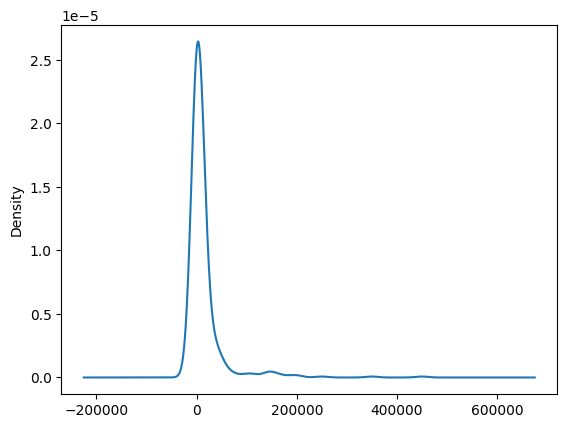

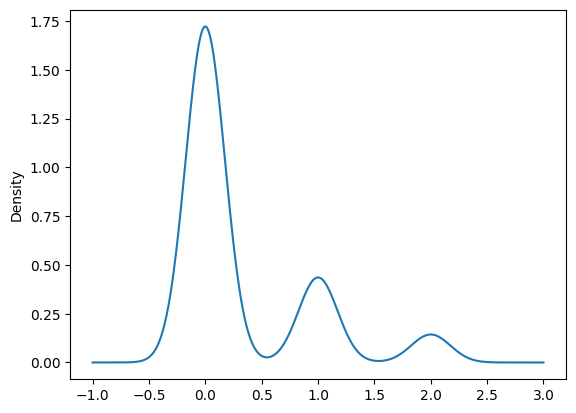

In [16]:
# Plotting values to compare the original TtC values (first chart) and the TtC classification values (second chart)
# Using the classification makes it easier to differentiate the data

filtered_df.ctt_original.plot.kde()
plt.show()
plt.close()

filtered_df.ctt.plot.kde()
plt.show()
plt.close()

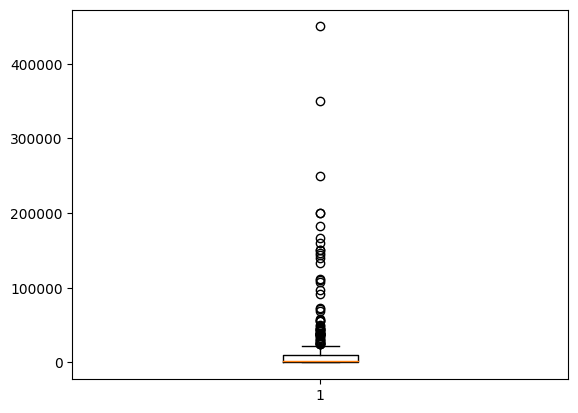

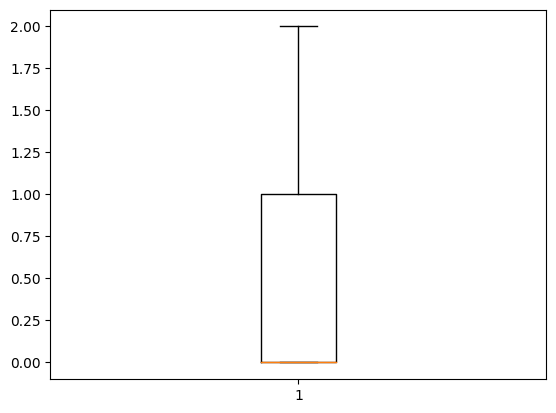

In [17]:
# Plotting values to compare the boxplot analysis of the original TtC values (first chart) and the TtC classification values
# (second chart)
# Using the classification reduces the impact of outliers

plt.boxplot(filtered_df.ctt_original)
plt.show()
plt.close()

plt.boxplot(filtered_df.ctt)
plt.show()
plt.close()

#4. Creating hydrological years datasets

In [18]:
# Define the hydrological years for each dataset
flood_year = ['2011_11', '2011_12', '2012_1', '2012_2', '2012_5', '2012_6', '2012_7', '2012_8']
normal_year = ['2012_11', '2012_12', '2013_1', '2013_2', '2013_5', '2013_6', '2013_7', '2013_8']
drought_year = ['2014_10', '2014_11', '2014_12', '2015_1', '2015_2', '2015_3', '2015_4', '2015_5', '2015_6', '2015_7', '2015_8']

# Create datasets based on the conditions above
flood = filtered_df[filtered_df['season'].isin(flood_year)]
normal = filtered_df[filtered_df['season'].isin(normal_year)]
drought = filtered_df[filtered_df['season'].isin(drought_year)]

# Add original index to each dataset
flood['original_index'] = flood.index
normal['original_index'] = normal.index
drought['original_index'] = drought.index

# Reindex the datasets
flood = flood.reset_index(drop=True)
normal = normal.reset_index(drop=True)
drought = drought.reset_index(drop=True)

In [19]:
# Check one of the datasets to check if the processing was correct (e.g., checking the 'drought' dataset)

drought

,conductivity,iron_total,ph,hardness,dbo,ctt,ctt_original,season,original_index
0,54.0,0.91,7.81,14.1,3,0,20.000000,2014_10,353
1,37.0,0.77,7.03,10.8,3,0,3.333333,2014_10,354
2,39.0,0.61,7.76,11.0,3,0,1.666667,2014_10,355
3,84.0,1.00,6.50,18.0,2,0,100.000000,2014_11,356
4,107.0,0.60,6.50,21.0,2,0,2500.000000,2014_11,357
...,...,...,...,...,...,...,...,...,...
121,148.0,1.00,7.10,35.0,5,2,96666.666667,2015_8,474
122,105.0,0.30,7.00,29.0,2,0,35.000000,2015_8,475
123,59.0,1.00,7.30,17.0,2,0,145.000000,2015_8,476
124,154.0,0.80,7.10,25.0,2,0,400.000000,2015_8,477


In [20]:
# Create datasets without the indices (it will be important for processing)

flood_no_index = flood.drop(columns=['original_index'])
normal_no_index = normal.drop(columns=['original_index'])
drought_no_index = drought.drop(columns=['original_index'])

In [21]:
# Check one of the datasets to check if the processing was correct (e.g., checking the 'flood' dataset)

flood_no_index

,conductivity,iron_total,ph,hardness,dbo,ctt,ctt_original,season
0,51.0,1.0,6.6,12.0,2,0,223.000000,2011_11
1,68.0,1.0,6.6,14.0,2,1,12000.000000,2011_11
2,88.0,1.0,6.6,13.0,2,0,1300.000000,2011_11
3,50.0,1.0,6.8,11.0,2,0,920.000000,2011_11
4,65.0,2.0,6.9,14.0,2,0,3700.000000,2011_11
...,...,...,...,...,...,...,...,...
90,89.0,1.0,7.3,22.0,7,2,111666.666667,2012_8
91,83.0,0.3,7.6,27.0,2,0,11.666667,2012_8
92,42.0,0.9,6.7,13.0,2,0,70.000000,2012_8
93,92.0,1.0,6.9,17.0,2,0,123.333333,2012_8


In [22]:
# Create the datasets for each index category (each will run a clustering model later)

flood_soil_indices = flood[['ph', 'conductivity']]
flood_irrigation_indices = flood[['iron_total', 'hardness','dbo','ctt']]
flood_all_indices = flood_no_index.copy()
flood_all_indices.drop(columns=['ctt_original','season'], inplace=True)

normal_soil_indices = normal[['ph', 'conductivity']]
normal_irrigation_indices = normal[['iron_total', 'hardness','dbo','ctt']]
normal_all_indices = normal_no_index.copy()
normal_all_indices.drop(columns=['ctt_original','season'], inplace=True)

drought_soil_indices = drought[['ph', 'conductivity']]
drought_irrigation_indices = drought[['iron_total', 'hardness','dbo','ctt']]
drought_all_indices = drought_no_index.copy()
drought_all_indices.drop(columns=['ctt_original','season'], inplace=True)

In [23]:
# Check one of the datasets to see if the processing was correct
# (e.g., checking the 'soil_indices' dataset for the 'flood' year)

flood_soil_indices

,ph,conductivity
0,6.6,51.0
1,6.6,68.0
2,6.6,88.0
3,6.8,50.0
4,6.9,65.0
...,...,...
90,7.3,89.0
91,7.6,83.0
92,6.7,42.0
93,6.9,92.0


In [24]:
# Check one of the datasets to see if the processing was correct
# (e.g., checking the 'irrigation_indices' dataset for the 'flood' year)

flood_irrigation_indices

,iron_total,hardness,dbo,ctt
0,1.0,12.0,2,0
1,1.0,14.0,2,1
2,1.0,13.0,2,0
3,1.0,11.0,2,0
4,2.0,14.0,2,0
...,...,...,...,...
90,1.0,22.0,7,2
91,0.3,27.0,2,0
92,0.9,13.0,2,0
93,1.0,17.0,2,0


#5. Finding the optimal value for k for each scenario

In [25]:
# K is the most important hyperparameter for the k-means clustering (for other models, this section should
# contain the analysis for the respective hyperparameters)
# We will use three different methods to identify the best value for k: elbow method, sillhouette, and dendrogram

In [26]:
# Function for finding the best value of k using WCSS (an important quality metric to compare values of k) and the elbow method

def find_optimal_k_elbow(data, dataset_name):
    # Create a dictionary for the WCSS values
    wcss = []

    # Scale the data using the standard scaler technique (will improve the quality of the clustering method
    # In some cases, the minmax scaler is more recommended, but we had good results with the standard z scaler)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Calculate WCSS for k for a range of values. We considered from 1 to 10, but more values could be considered
    for k in range(1, 11):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        kmeans.fit(scaled_data)
        wcss.append(kmeans.inertia_)

    # Plot the elbow method graph (which must be analyzed by the user)
    plt.plot(range(1, 11), wcss, marker='o', linestyle='-')
    plt.title(f'Elbow Method ({dataset_name})')
    plt.xlabel('Number of Clusters (k value)')
    plt.ylabel('WCSS')
    plt.legend()
    plt.show()

In [27]:
# Function to find the best value of k for a dataset using the silhouette score (another quality metric)

def find_optimal_k_silhouette(data, dataset_name):
    # Define base parameters
    max_silhouette_score = -1
    optimal_k = 2

    # Scale the data using the standard scaler (same comment as before)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Calculate silhouette score for k from 2 to 10 using the k-means++ method
    for k in range(2, 11):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        labels = kmeans.fit_predict(scaled_data)
        silhouette_avg = silhouette_score(scaled_data, labels)
        if silhouette_avg > max_silhouette_score:
            max_silhouette_score = silhouette_avg
            optimal_k = k

    # Print the optimal value for k considering the silhouette score
    print(f"Optimal k (Silhouette Score - {dataset_name}):", optimal_k)
    return optimal_k

In [28]:
# Function to find the best value for k using the dendrogram method (with the ward technique)

def find_optimal_k_dendrogram(data, dataset_name):
    # Calculate the linkage matrix
    Z = linkage(data, method='ward')

    # Plot the dendrogram
    plt.figure(figsize=(10, 5))
    dendrogram(Z)
    plt.title(f'Dendrogram ({dataset_name})')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    plt.show()

Dataset: flood_soil_indices
-------------------------


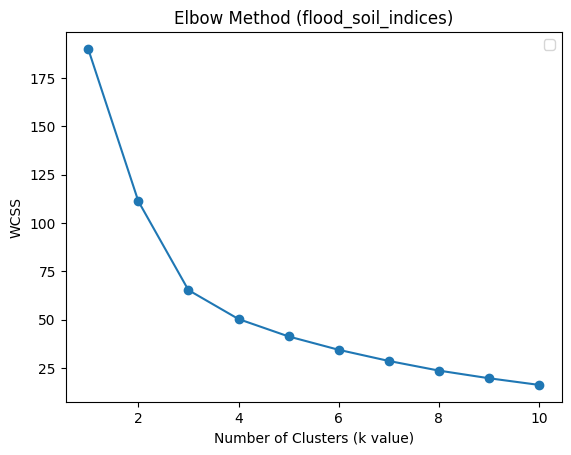



Optimal k (Silhouette Score - flood_soil_indices): 2




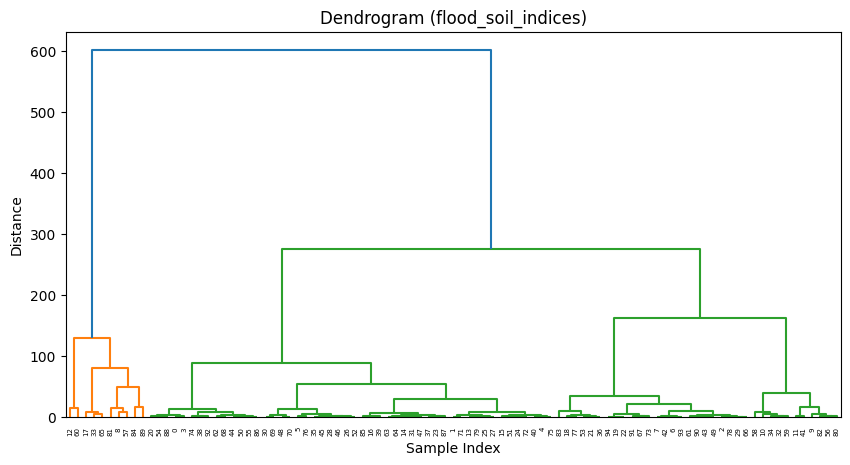



Dataset: flood_irrigation_indices
-------------------------


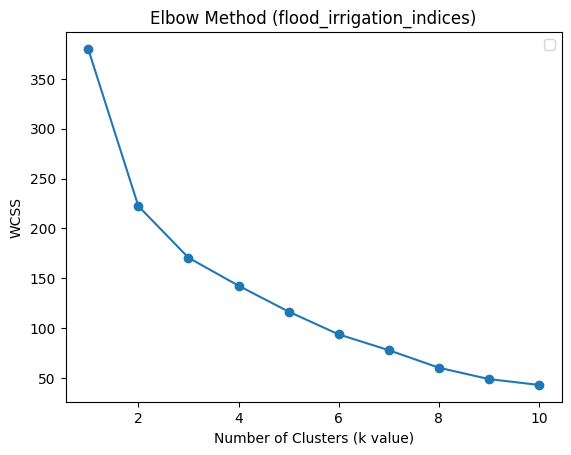



Optimal k (Silhouette Score - flood_irrigation_indices): 2




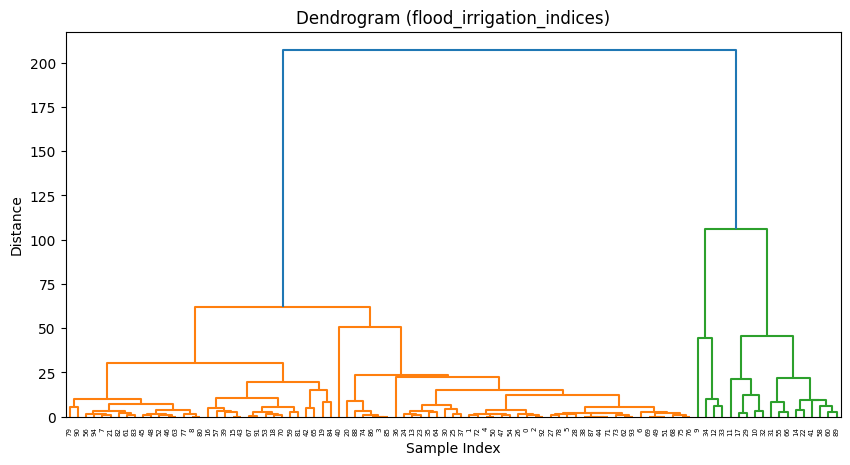



Dataset: flood_all_indices
-------------------------


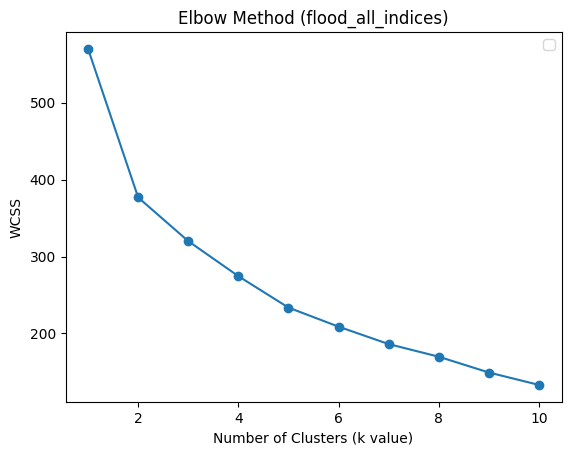



Optimal k (Silhouette Score - flood_all_indices): 2




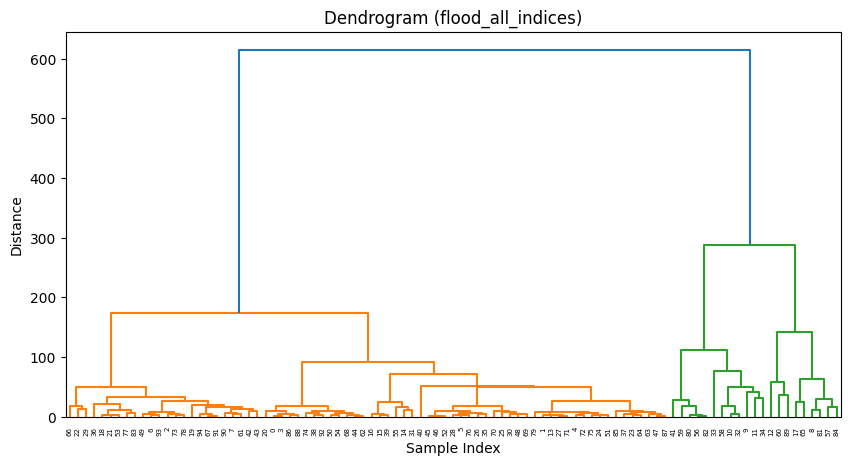



Dataset: normal_soil_indices
-------------------------


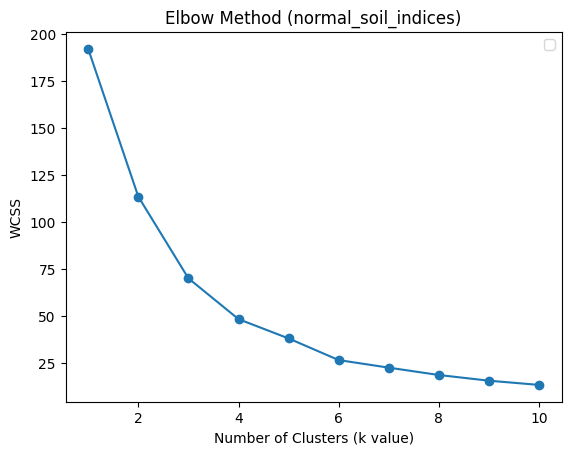



Optimal k (Silhouette Score - normal_soil_indices): 3




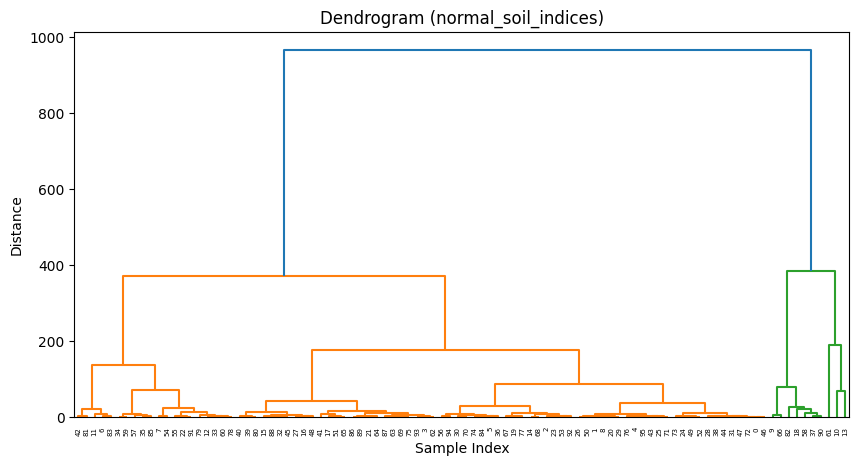



Dataset: normal_irrigation_indices
-------------------------


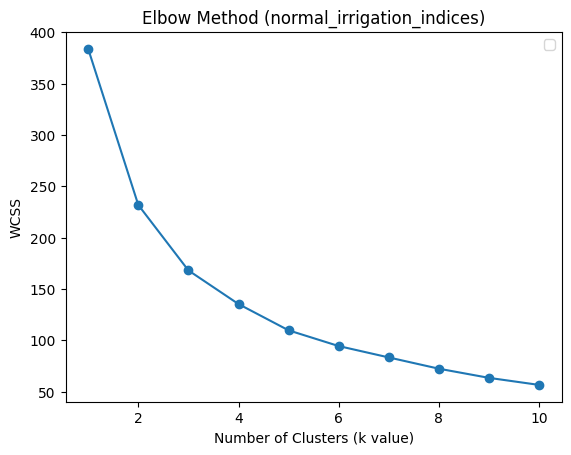



Optimal k (Silhouette Score - normal_irrigation_indices): 2




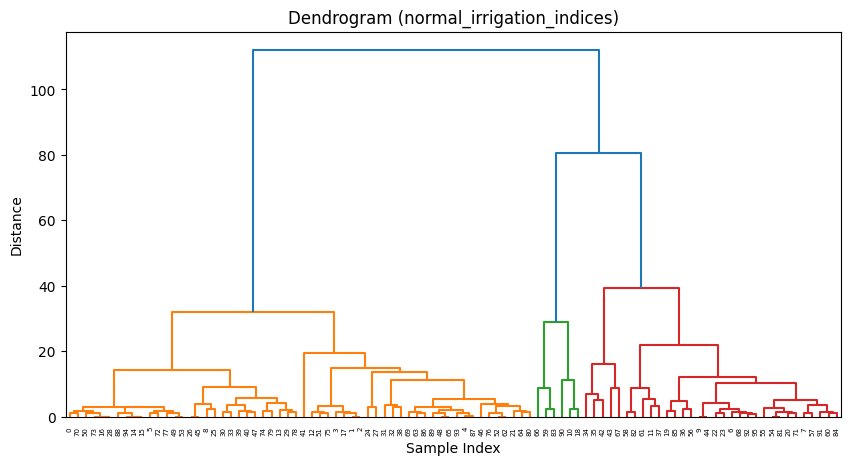



Dataset: normal_all_indices
-------------------------


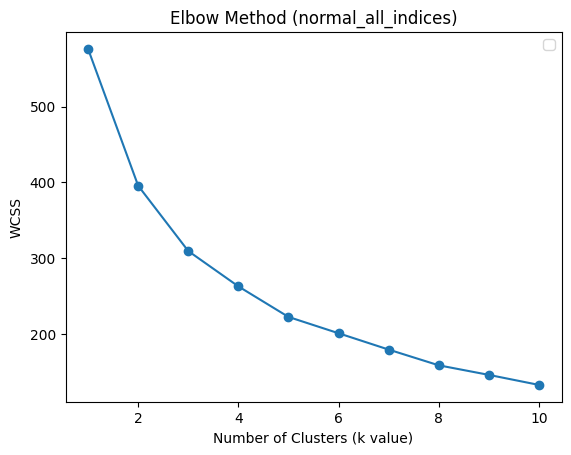



Optimal k (Silhouette Score - normal_all_indices): 3




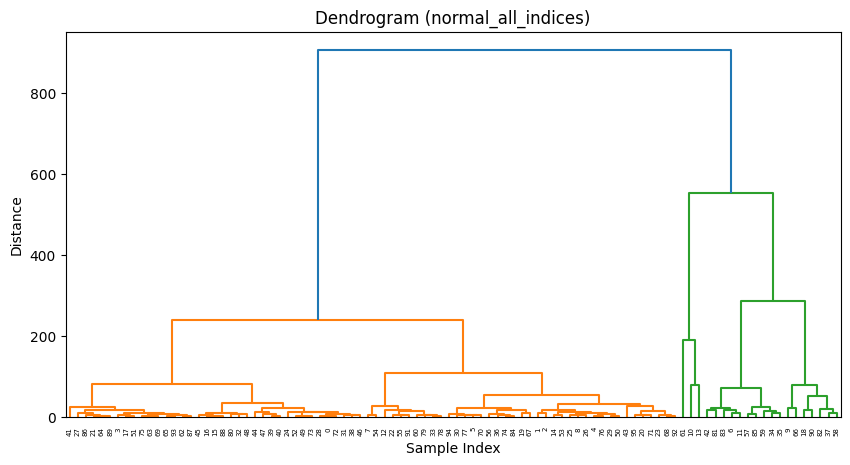



Dataset: drought_soil_indices
-------------------------


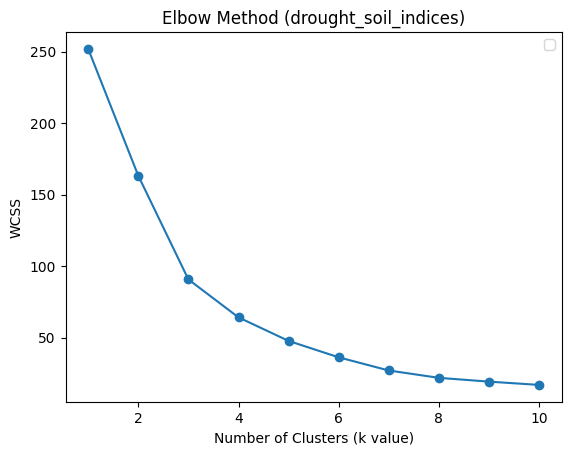



Optimal k (Silhouette Score - drought_soil_indices): 2




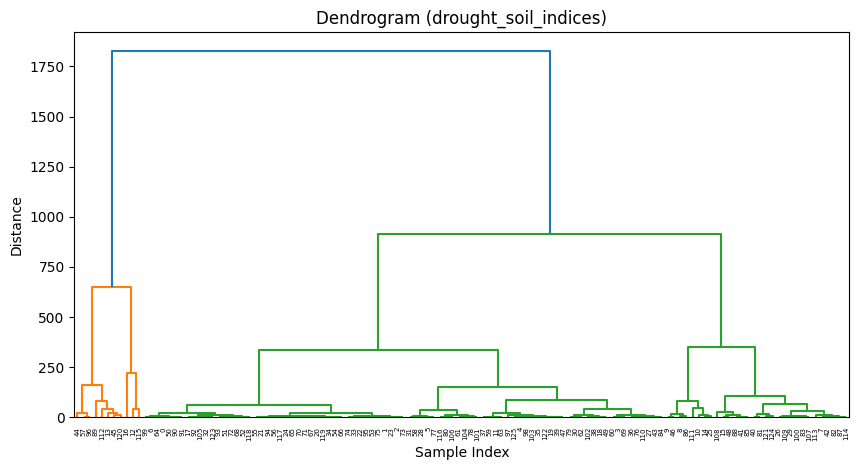



Dataset: drought_irrigation_indices
-------------------------


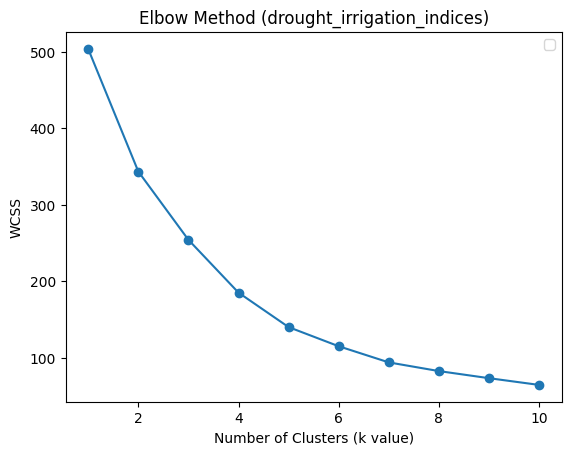



Optimal k (Silhouette Score - drought_irrigation_indices): 2




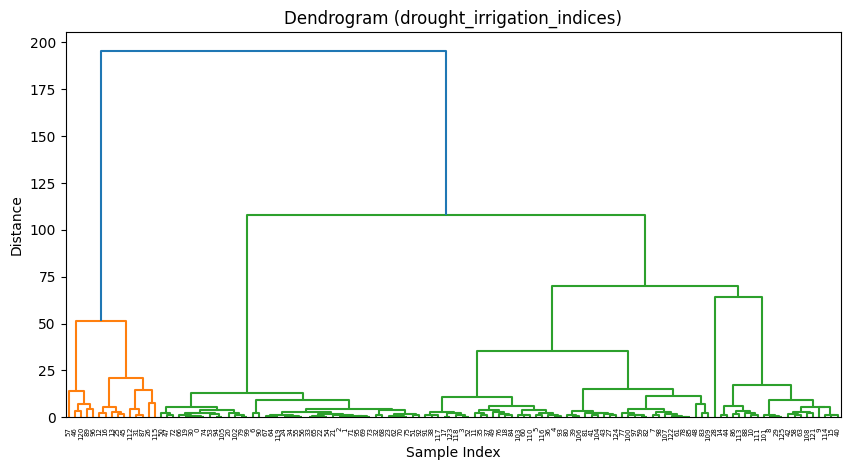



Dataset: drought_all_indices
-------------------------


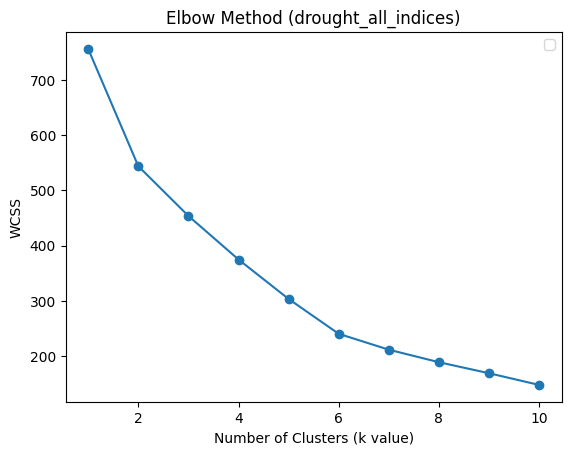



Optimal k (Silhouette Score - drought_all_indices): 2




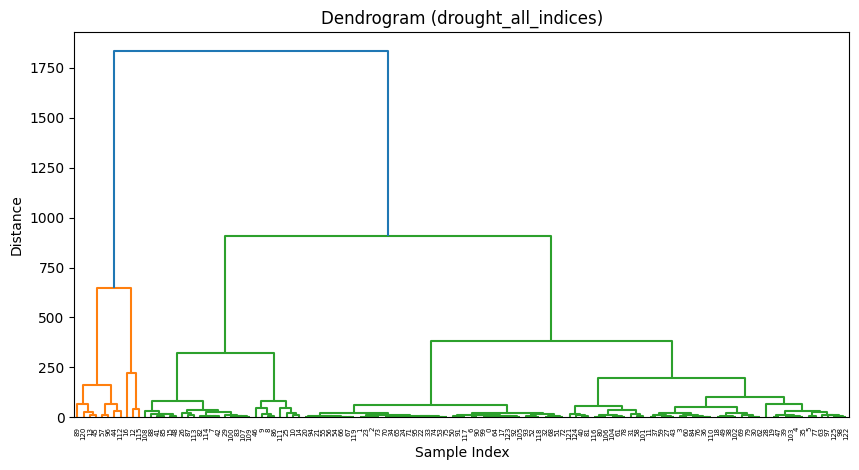

In [29]:
# Code to loop and generate results for the three techniques for each dataset (a dataset in this work
# is a combination of the indices used and the hydrological year)

# Define the dictionary of the final datasets
datasets = {'flood_soil_indices': flood_soil_indices,
            'flood_irrigation_indices': flood_irrigation_indices,
            'flood_all_indices': flood_all_indices,
            'normal_soil_indices': normal_soil_indices,
            'normal_irrigation_indices': normal_irrigation_indices,
            'normal_all_indices': normal_all_indices,
            'drought_soil_indices':drought_soil_indices,
            'drought_irrigation_indices':drought_irrigation_indices,
            'drought_all_indices':drought_all_indices
            }

# Create a list of the best values for k
optimal_ks = []

# For loop to iterate between methods and datasets
for dataset_name, dataset in datasets.items():
    print("Dataset:", dataset_name)
    print("-------------------------")

    # Finding optimal k for each method

    # It is important to note that the elbow method needs manual evaluation
    optimal_k_elbow = find_optimal_k_elbow(dataset, dataset_name)
    print("\n")
    optimal_k_silhouette = find_optimal_k_silhouette(dataset, dataset_name)
    print("\n")
    # It is important to note that the dendrogram needs manual evaluation
    find_optimal_k_dendrogram(dataset, dataset_name)

    print("\n")


#6. Analyzing values for k

In [30]:
# Analyze each combination of dataset and method to define best values for k. In this work, we have decided to consider
# a majority vote for choosing the best value of k (considering the results of step 5).

# 1-Summary of the best values (considering majority vote in case of draw)

# - flood_soil_indices: 2
# - flood_irrigation_indices: 3
# - flood_all_indices: 2
# - normal_soil_indices: 4
# - normal_irrigation_indices: 3
# - normal_all_indices: 3
# - drought_soil_indices: 4
# - drought_irrigation_indices: 3
# - drought_all_indices: 2

# 2-Detailed analysis (considering all potential values)

# flood_soil_indices
# - elbow: 2 or 3
# - silhouette: 2
# - dendrogram: 2 or 3
# - majority: 2

# flood_irrigation_indices
# - elbow: 2 or 3
# - silhouette: 2
# - dendrogram: 2 or 3 (probably 3)
# - majority: 3

# flood_all_indices
# - elbow: 2 or 3
# - silhouette: 2
# - dendrogram: 2
# - majority: 2

# normal_soil_indices
# - elbow: 3 or 4
# - silhouette: 3
# - dendrogram: 2 or 4
# - majority: 4

# normal_irrigation_indices
# - elbow: 2 or 3
# - silhouette: 2
# - dendrogram: 3 or 4
# - majority: 3

# normal_all_indices
# - elbow: 2 or 3
# - silhouette: 3
# - dendrogram: 2
# - majority: 3

# drought_soil_indices
# - elbow: 3 or 4
# - silhouette: 2
# - dendrogram: 2 or 4
# - majority: 4

# drought_irrigation_indices
# - elbow: 2 or 3
# - silhouette: 2
# - dendrogram: 2 or 3 (probably 3)
# - majority: 3

# drought_all_indices
# - elbow: 2 or 3
# - silhouette: 2
# - dendrogram: 2
# - majority: 2

In [31]:
# Best values of k considering the majority vote of the analysis above

k_flood_soil_indices = 2
k_flood_irrigation_indices = 3
k_flood_all_indices = 2
k_normal_soil_indices = 4
k_normal_irrigation_indices = 3
k_normal_all_indices = 3
k_drought_soil_indices = 4
k_drought_irrigation_indices = 3
k_drought_all_indices = 2

#7. Running the clustering model for each scenario

In [32]:
# Function that will automatically rename a cluster label based on the average a feature
# This is important because the cluster labels have no connection with the values of the features themselves
# (they are just sequential values)

def rename_cluster_labels(data, labels):
    data['label'] = labels

    # We consider in this code renaming by the first column in the dataset, because each dataset has different variables
    # However it would be possible to insert a dictionary here and choose specific columns
    feature_column = data.columns[0]

    cluster_means = data.groupby('label')[feature_column].mean()
    cluster_means_sorted = cluster_means.sort_values().index
    label_map = {cluster_means_sorted[i]: i for i in range(len(cluster_means_sorted))}
    data['label'] = data['label'].map(label_map)
    return data['label']

In [33]:
# Code to loop through all the datasets, using the best value of k, clustering using the k-means method,
# and then renaming the cluster labels so the order is related to the mean values of the first column of the dataset
# Then, print all cluster means for each dataset

# Create the list of datasets
datasets = ['flood_soil_indices', 'flood_irrigation_indices', 'flood_all_indices',
            'normal_soil_indices', 'normal_irrigation_indices', 'normal_all_indices',
            'drought_soil_indices', 'drought_irrigation_indices', 'drought_all_indices']

# Loop through the datasets list
for dataset_name in datasets:

    # Get the best value of k for the current dataset (calculated above based on the majority of the 3 methods)
    k_value = globals()['k_' + dataset_name]

    # Retrieve the dataset original dataset
    dataset = globals()[dataset_name]

    # Run k-means clustering
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(dataset)

    kmeans = KMeans(n_clusters=k_value, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(dataset)

    # Rename the cluster labels, considering the function that sorts values of the first column
    dataset['label'] = rename_cluster_labels(dataset, labels)

    # Rename the label column to include the dataset name
    dataset.rename(columns={'label': dataset_name + '_label'}, inplace=True)

In [34]:
# Check if the rows were correctly labelled for one of the datasets

flood_soil_indices

,ph,conductivity,flood_soil_indices_label
0,6.6,51.0,0
1,6.6,68.0,0
2,6.6,88.0,0
3,6.8,50.0,0
4,6.9,65.0,0
...,...,...,...
90,7.3,89.0,0
91,7.6,83.0,0
92,6.7,42.0,0
93,6.9,92.0,0


In [35]:
# Check if the rows were correctly labelled for other dataset

flood_irrigation_indices

,iron_total,hardness,dbo,ctt,flood_irrigation_indices_label
0,1.0,12.0,2,0,0
1,1.0,14.0,2,1,0
2,1.0,13.0,2,0,0
3,1.0,11.0,2,0,0
4,2.0,14.0,2,0,0
...,...,...,...,...,...
90,1.0,22.0,7,2,0
91,0.3,27.0,2,0,0
92,0.9,13.0,2,0,0
93,1.0,17.0,2,0,0


In [36]:
# Add the cluster label columns to the original datasets

flood_datasets = ['flood_soil_indices', 'flood_irrigation_indices', 'flood_all_indices']
normal_datasets = ['normal_soil_indices', 'normal_irrigation_indices', 'normal_all_indices']
drought_datasets = ['drought_soil_indices', 'drought_irrigation_indices', 'drought_all_indices']

for dataset_name in flood_datasets:
    label_column = dataset_name + '_label'
    flood[label_column] = globals()[dataset_name][dataset_name + '_label']

for dataset_name in normal_datasets:
    label_column = dataset_name + '_label'
    normal[label_column] = globals()[dataset_name][dataset_name + '_label']

for dataset_name in drought_datasets:
    label_column = dataset_name + '_label'
    drought[label_column] = globals()[dataset_name][dataset_name + '_label']

In [37]:
# Check if the cluster label column was correctly added to one of the original datasets

flood.head()

,conductivity,iron_total,ph,hardness,dbo,ctt,ctt_original,season,original_index,flood_soil_indices_label,flood_irrigation_indices_label,flood_all_indices_label
0,51.0,1.0,6.6,12.0,2,0,223.0,2011_11,46,0,0,0
1,68.0,1.0,6.6,14.0,2,1,12000.0,2011_11,47,0,0,0
2,88.0,1.0,6.6,13.0,2,0,1300.0,2011_11,48,0,0,0
3,50.0,1.0,6.8,11.0,2,0,920.0,2011_11,49,0,0,0
4,65.0,2.0,6.9,14.0,2,0,3700.0,2011_11,50,0,0,0


#8. Adding the location back to the scenarios

In [38]:
# Define the location columns to be added (in the case of this dataset, latitude, longitude, and the
# station ID)

columns_to_add = ['latitude_decimal', 'longitude_decimal', 'cod_interaguas']
season_column = 'season'

# Loop through each of the original datasets in turn: flood, normal, and drought
for dataset_name in ['flood', 'normal', 'drought']:

    # Retrieve the original dataset
    dataset = globals()[dataset_name]

    # Get the original indices from the 'original_index' column
    original_indices = dataset['original_index']

    # Select the corresponding rows from the raw dataset ('raw_df') based on the 'original_index' column
    selected_raw_df = raw_df.loc[original_indices, columns_to_add]

    # Select the corresponding rows from the clean dataset ('df') based on the 'original_index' column
    selected_df = df.loc[original_indices, [season_column]]

    # Add the selected columns from 'raw_df' and 'df' to the current dataset
    dataset[columns_to_add] = selected_raw_df.values
    dataset[season_column] = selected_df[season_column].values

In [39]:
# Check if the cluster labels were correctly added to one of the datasets

drought.tail()

,conductivity,iron_total,ph,hardness,dbo,ctt,ctt_original,season,original_index,drought_soil_indices_label,drought_irrigation_indices_label,drought_all_indices_label,latitude_decimal,longitude_decimal,cod_interaguas
121,148.0,1.0,7.1,35.0,5,2,96666.666667,2015_8,474,0,0,0,-23.208333,-46.768611,71.0
122,105.0,0.3,7.0,29.0,2,0,35.000000,2015_8,475,1,0,0,-23.158333,-46.909444,82.0
123,59.0,1.0,7.3,17.0,2,0,145.000000,2015_8,476,1,1,0,-23.261944,-47.057778,274.0
124,154.0,0.8,7.1,25.0,2,0,400.000000,2015_8,477,0,0,0,-23.183056,-47.243889,320.0
125,106.0,1.0,7.2,36.0,2,0,450.000000,2015_8,478,1,0,0,-23.164167,-47.015000,1947.0


#9. Mapping the stations using the basin shapefile

In [40]:
# Load the basin shapefile

shapefile_path = '/content/drive/MyDrive/Agri Rios 2024/Artigo Agriengineering - AgriRios 2024/dados/GEOFT_BHO_PCJ_TDR/GEOFT_BHO_PCJ_TDR.shp'
shapefile = gpd.read_file(shapefile_path)

In [41]:
# Convert the 'flood' dataframe to a GeoDataFrame

geometry = [Point(xy) for xy in zip(flood['longitude_decimal'], flood['latitude_decimal'])]
flood_gdf = gpd.GeoDataFrame(flood, geometry=geometry, crs=shapefile.crs)

In [42]:
# Convert the 'normal' dataframe to a GeoDataFrame

geometry = [Point(xy) for xy in zip(normal['longitude_decimal'], normal['latitude_decimal'])]
normal_gdf = gpd.GeoDataFrame(normal, geometry=geometry, crs=shapefile.crs)

In [43]:
# Convert the 'drought' dataframe to a GeoDataFrame

geometry = [Point(xy) for xy in zip(drought['longitude_decimal'], drought['latitude_decimal'])]
drought_gdf = gpd.GeoDataFrame(drought, geometry=geometry, crs=shapefile.crs)

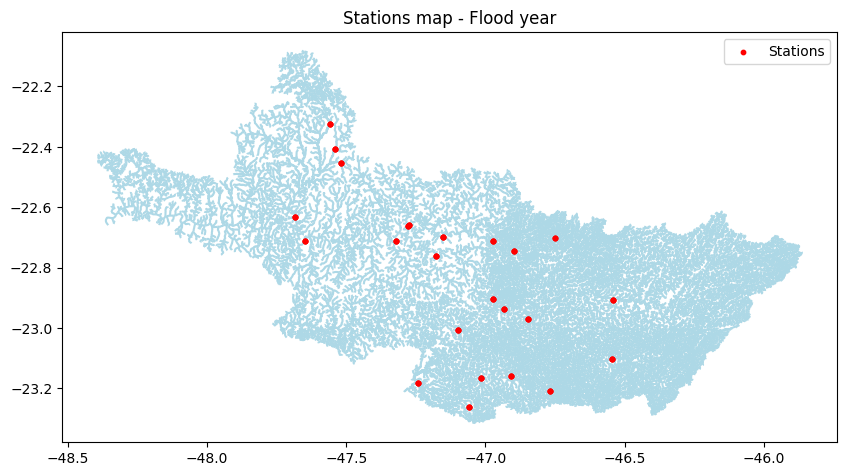

In [44]:
# Plot the map for one of the datasets to check the locations of the stations

# Plot the shapefile first
fig, ax = plt.subplots(figsize=(10, 10))
shapefile.plot(ax=ax, color='lightblue', zorder=1)

# Plot the points from the 'flood' dataframe on top of the shapefile
flood_gdf.plot(ax=ax, color='red', markersize=10, label='Stations', zorder=2)

# Add title and legend
plt.title('Stations map - Flood year')
plt.legend()

#10. Analyze the distributions for the input variables or parameters

       conductivity  iron_total         ph   hardness        dbo        ctt  \
count     95.000000   95.000000  95.000000  95.000000  95.000000  95.000000   
mean      92.901053    3.917789   6.937895  26.485053   3.452632   0.357895   
std       51.796746    6.142441   0.217422  18.037685   2.923741   0.599925   
min       41.000000    0.300000   6.300000   3.480000   2.000000   0.000000   
25%       59.350000    1.000000   6.800000  16.000000   2.000000   0.000000   
50%       77.000000    2.000000   6.900000  20.000000   2.000000   0.000000   
75%       97.500000    3.000000   7.100000  29.500000   4.000000   1.000000   
max      285.000000   38.000000   7.600000  97.000000  19.000000   2.000000   

        ctt_original  
count      95.000000  
mean    14602.105263  
std     29306.586914  
min        11.666667  
25%       583.333333  
50%      3500.000000  
75%     13083.333333  
max    143333.333333  


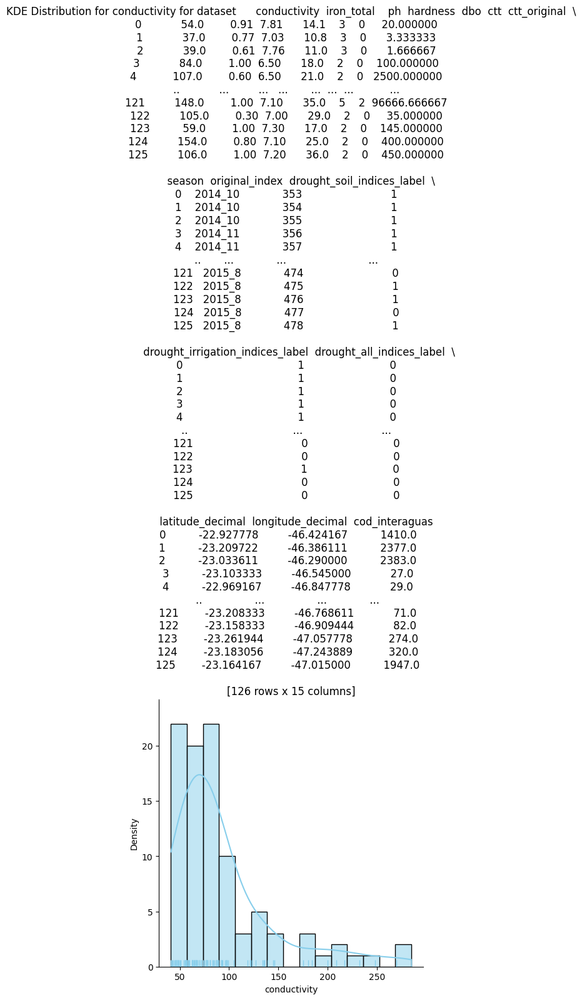

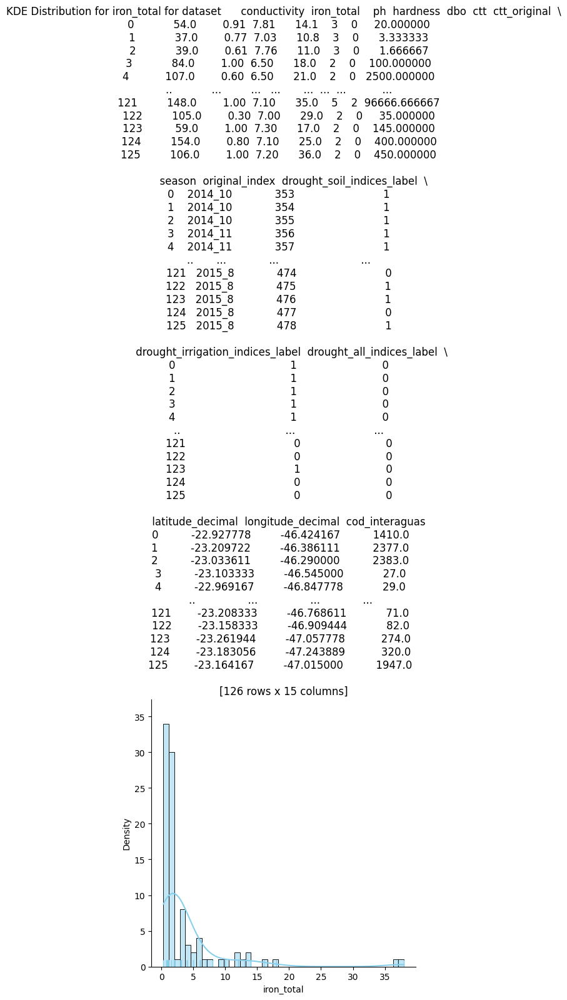

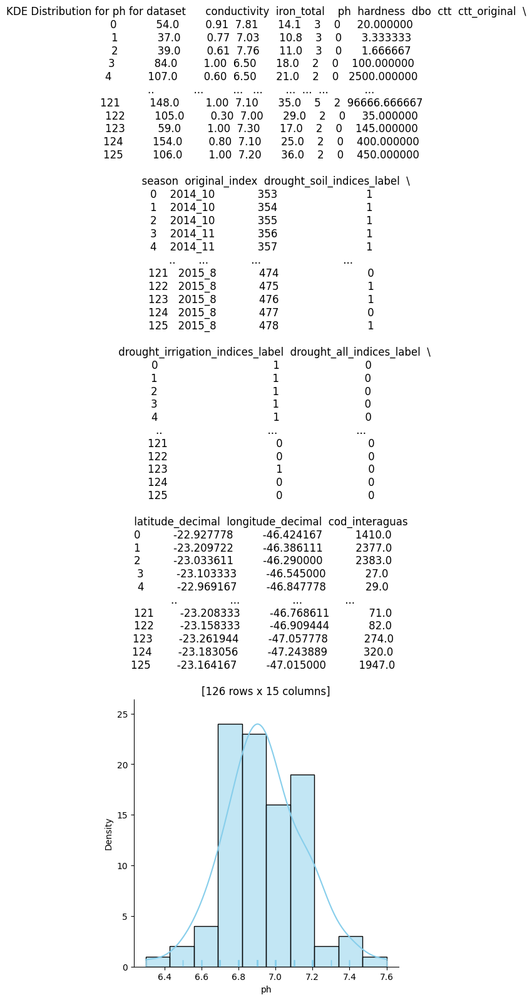

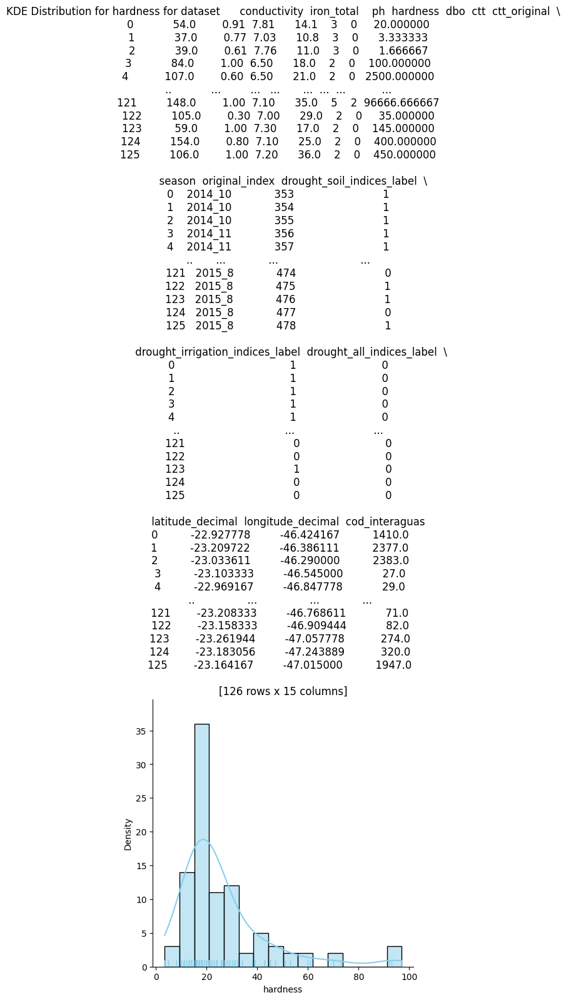

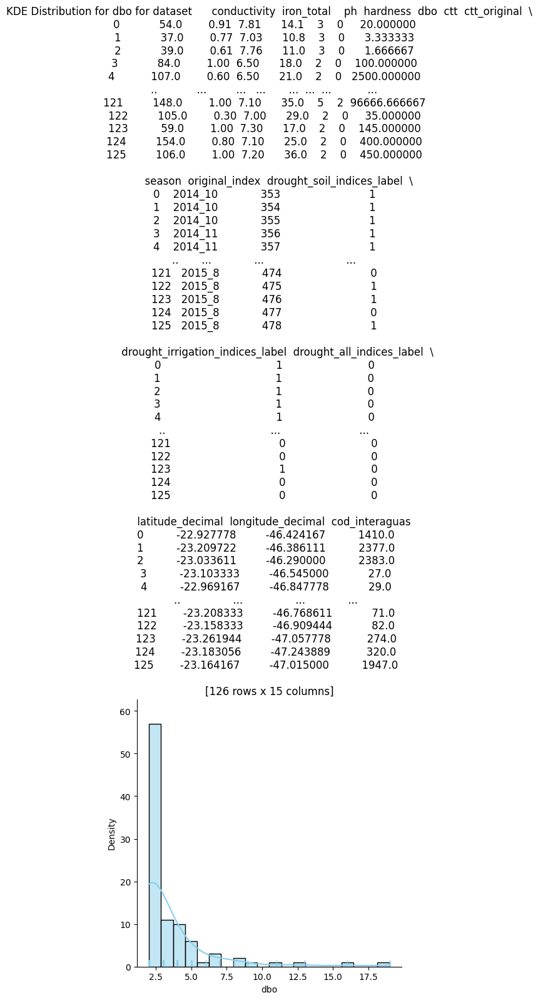

...

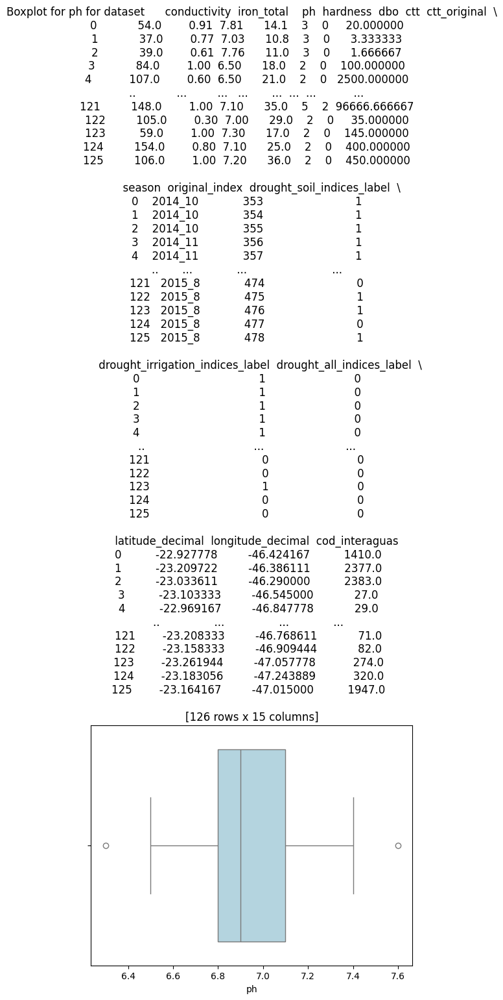

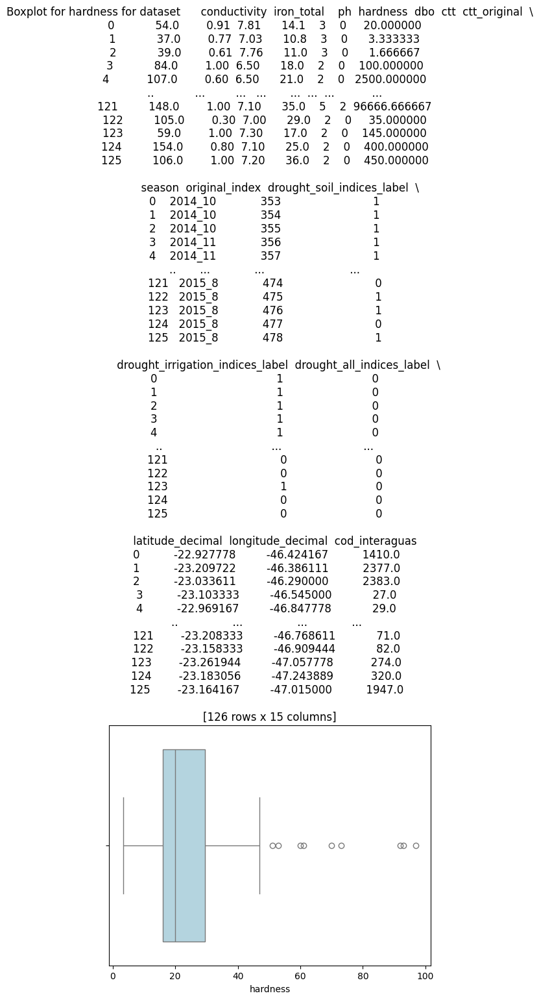

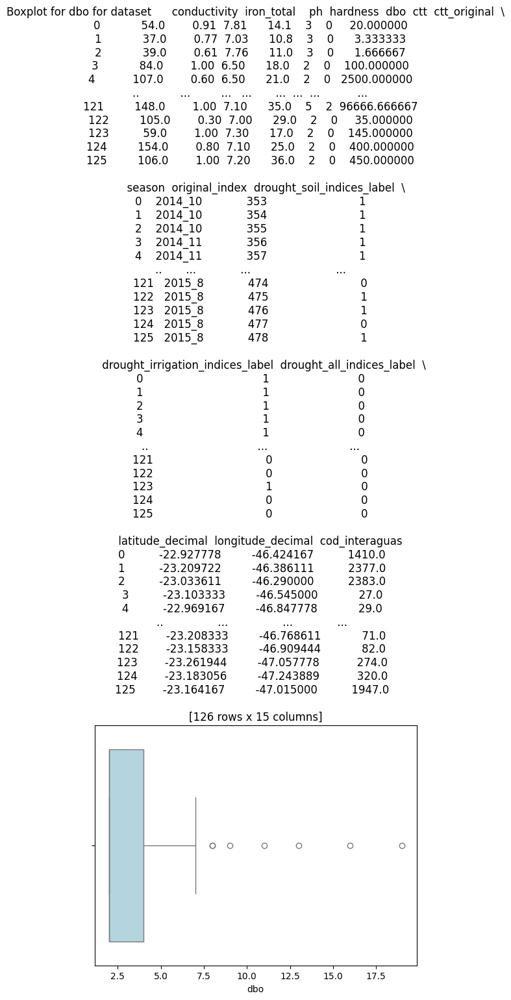

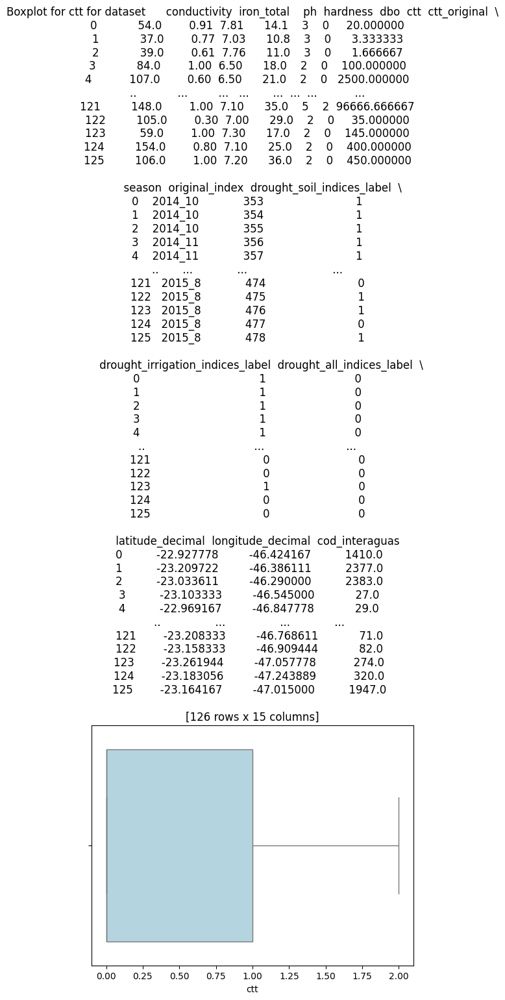

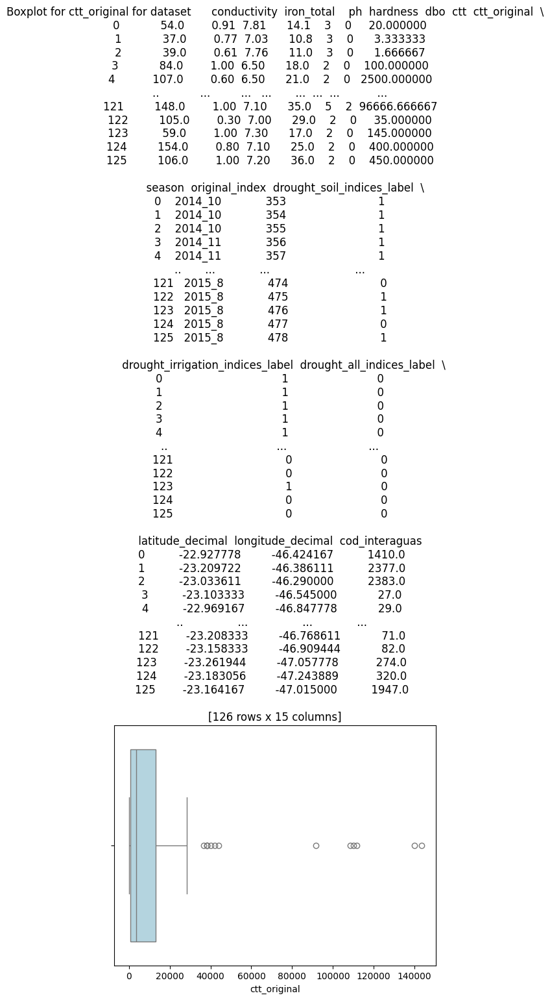

In [45]:
# Choose which variables or parameters will be analyzed for the flood dataset

variables_of_interest = ['conductivity', 'iron_total', 'ph', 'hardness', 'dbo', 'ctt', 'ctt_original']

# Calculate the basic statistics for each variable

basic_stats = flood_gdf[variables_of_interest].describe()
print(basic_stats)

# Draw KDE distributions for each column

for variable in variables_of_interest:
    sns.displot(flood_gdf[variable], kde=True, rug=True, color='skyblue', label='KDE')
    plt.title(f'KDE Distribution for {variable} for dataset {dataset}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

# Create boxplots for each column

for variable in variables_of_interest:
    sns.boxplot(x=flood_gdf[variable], color='lightblue')
    plt.title(f'Boxplot for {variable} for dataset {dataset}')
    plt.xlabel(variable)
    plt.show()


       conductivity  iron_total         ph   hardness        dbo        ctt  \
count     96.000000   96.000000  96.000000  96.000000  96.000000  96.000000   
mean     109.552083    2.711354   6.942188  24.125000   3.822917   0.270833   
std       83.633611    3.122735   0.365796  10.873677   2.432217   0.552109   
min       37.300000    0.300000   6.300000  10.000000   2.000000   0.000000   
25%       62.375000    1.000000   6.700000  17.000000   2.000000   0.000000   
50%       82.000000    2.000000   6.850000  21.500000   3.000000   0.000000   
75%      116.000000    3.000000   7.100000  28.000000   5.000000   0.000000   
max      553.000000   19.000000   9.100000  70.000000  11.000000   2.000000   

        ctt_original  
count      96.000000  
mean    10796.718750  
std     28243.451888  
min        16.666667  
25%       691.666667  
50%      2333.333333  
75%      7500.000000  
max    200000.000000  


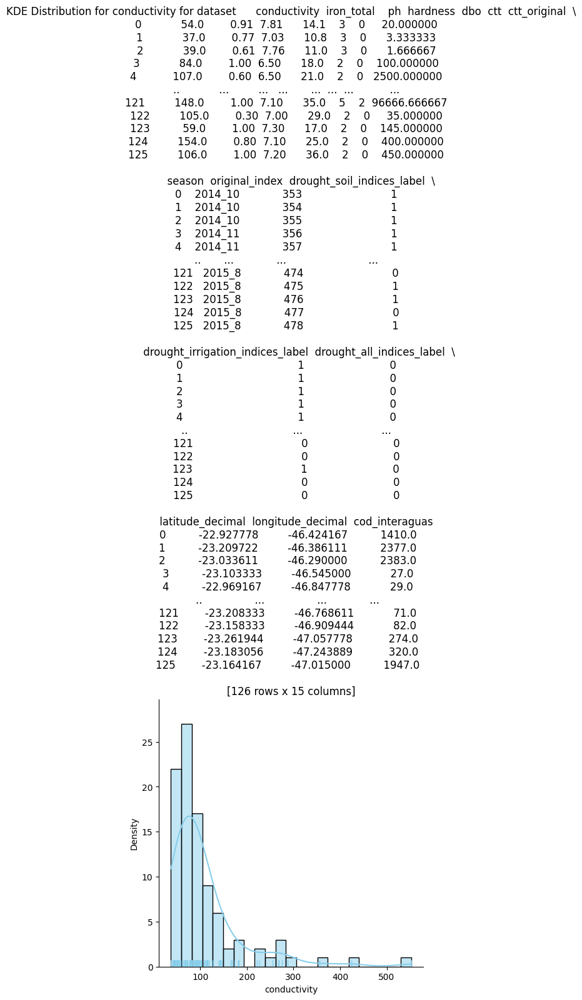

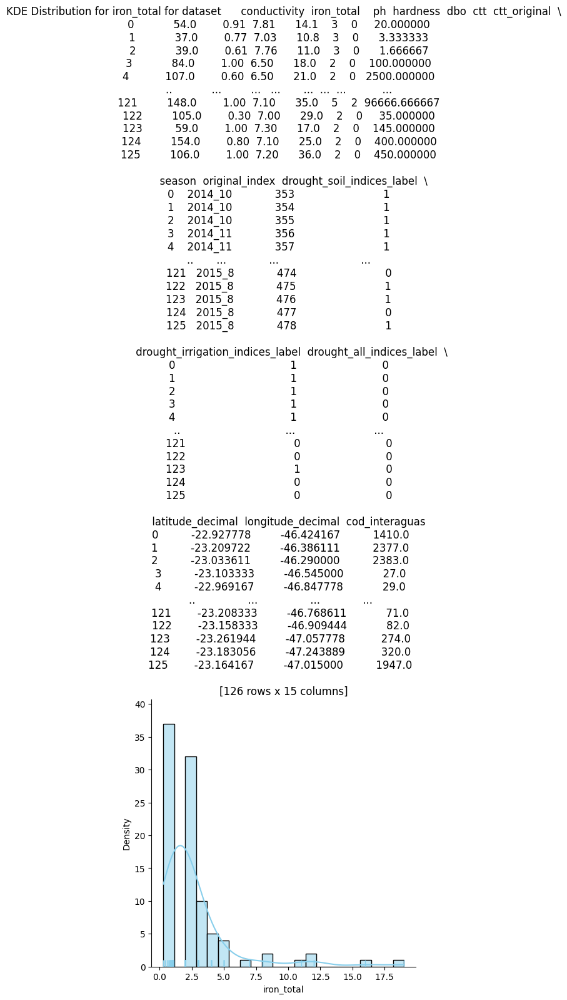

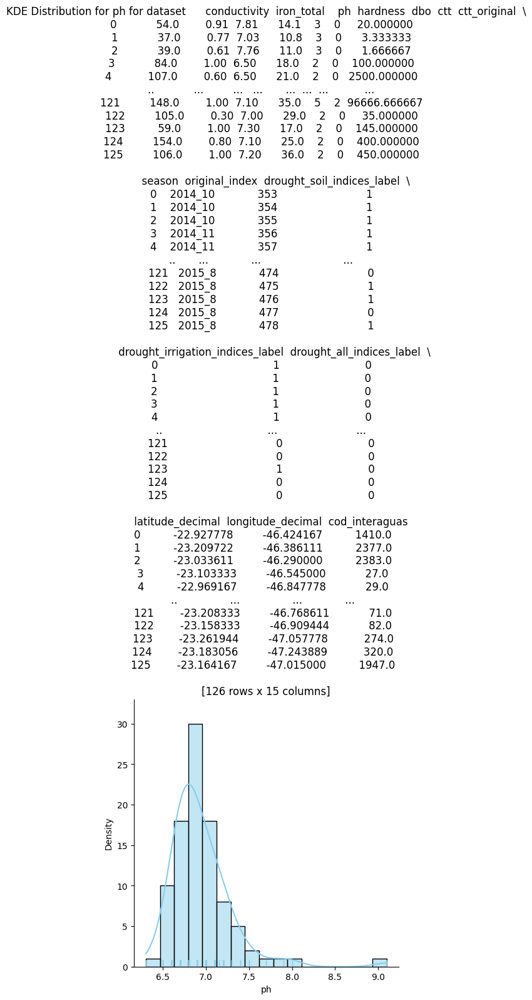

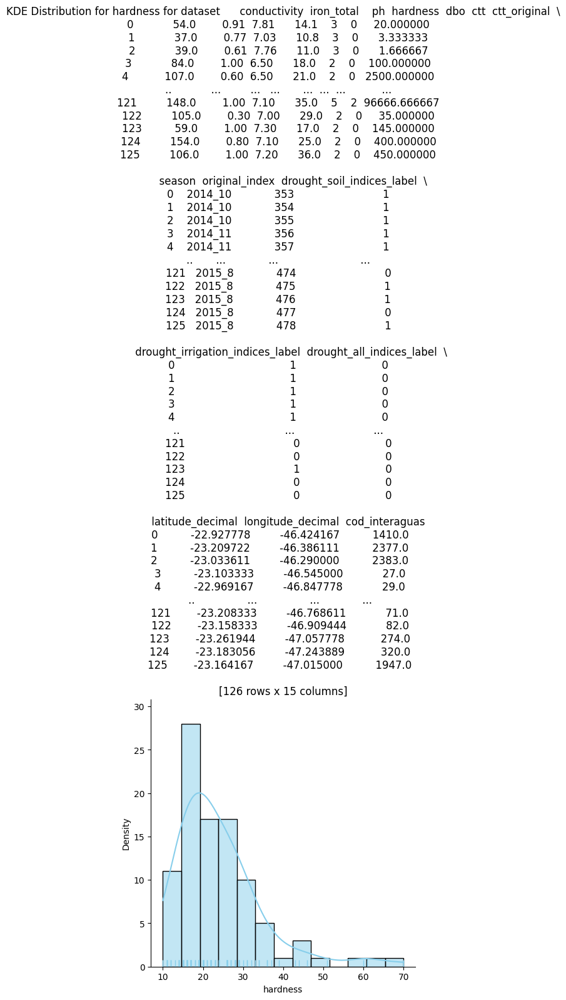

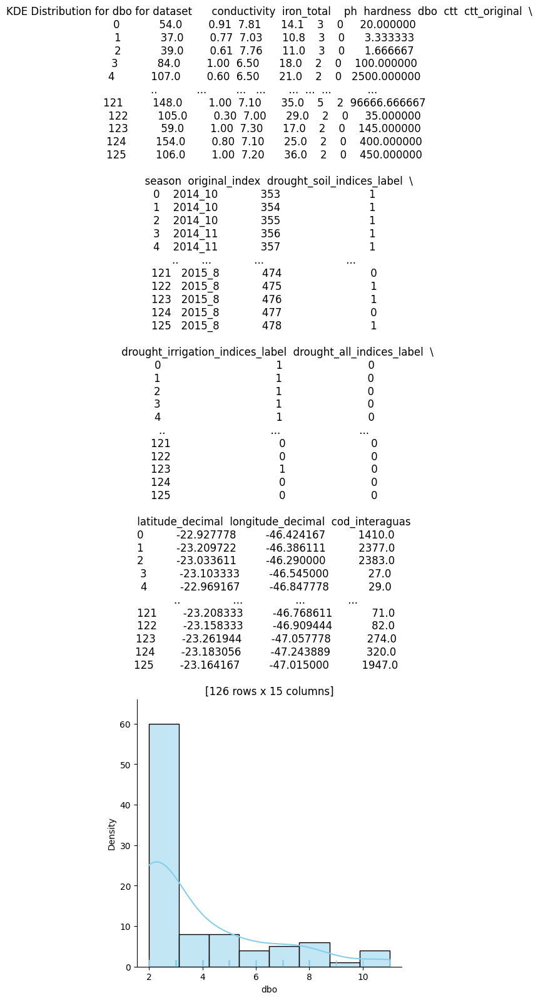

...

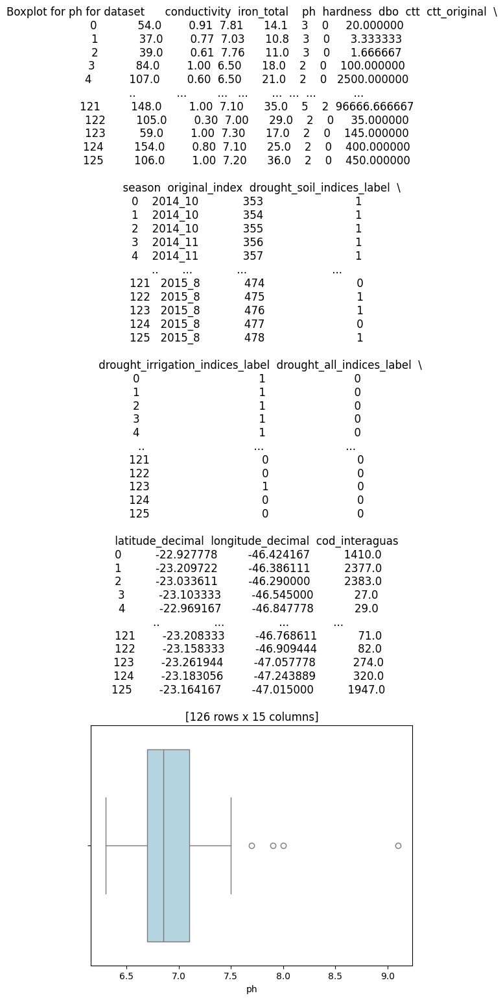

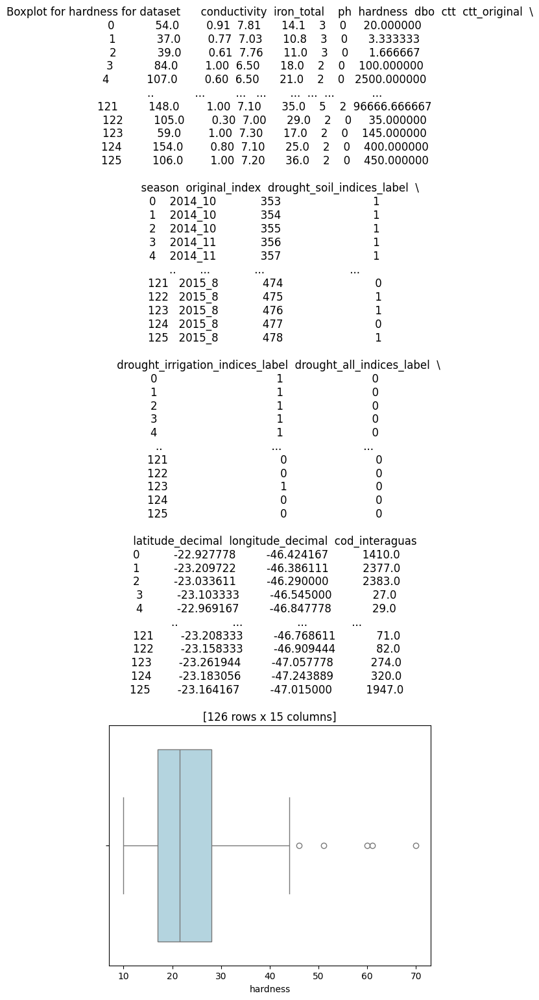

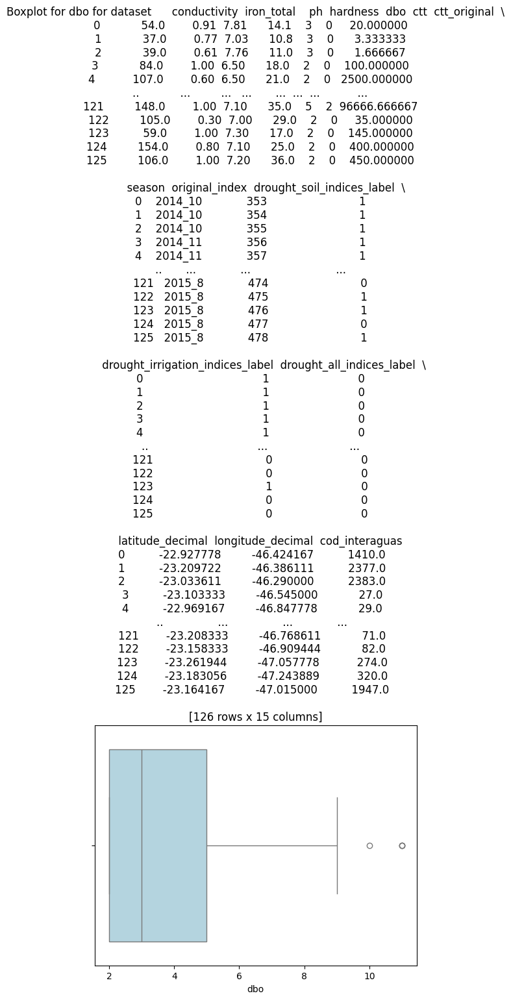

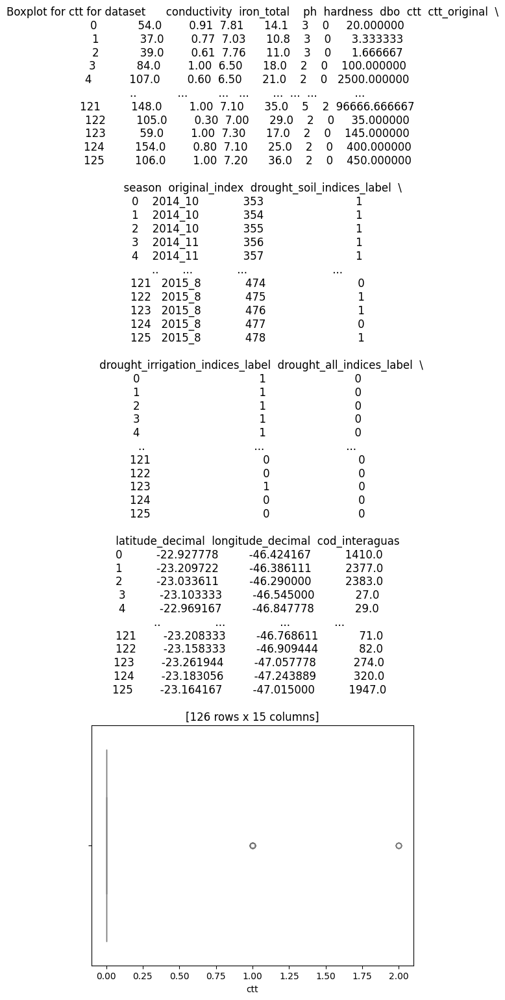

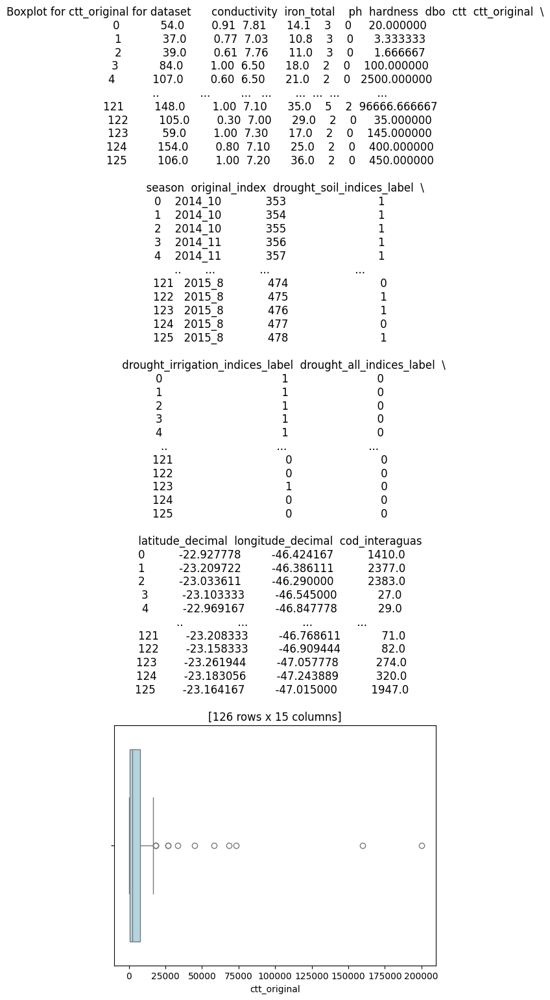

In [46]:
# Choose which variables or parameters will be analyzed for the normal dataset

variables_of_interest = ['conductivity', 'iron_total', 'ph', 'hardness', 'dbo', 'ctt', 'ctt_original']

# Calculate the basic statistics for each variable

basic_stats = normal_gdf[variables_of_interest].describe()
print(basic_stats)

# Draw KDE distributions for each column

for variable in variables_of_interest:
    sns.displot(normal_gdf[variable], kde=True, rug=True, color='skyblue', label='KDE')
    plt.title(f'KDE Distribution for {variable} for dataset {dataset}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

# Create boxplots for each column

for variable in variables_of_interest:
    sns.boxplot(x=normal_gdf[variable], color='lightblue')
    plt.title(f'Boxplot for {variable} for dataset {dataset}')
    plt.xlabel(variable)
    plt.show()


       conductivity  iron_total          ph    hardness         dbo  \
count    126.000000  126.000000  126.000000  126.000000  126.000000   
mean     147.426190    1.181667    7.027540   26.064127    3.928571   
std      141.205236    0.830621    0.394122   15.458309    4.706045   
min       37.000000    0.240000    6.100000    9.880000    2.000000   
25%       56.500000    0.712500    6.800000   13.925000    2.000000   
50%      101.000000    1.000000    7.000000   22.000000    3.000000   
75%      180.500000    1.237500    7.200000   33.500000    4.000000   
max      874.000000    6.000000    8.600000   81.000000   50.000000   

              ctt   ctt_original  
count  126.000000     126.000000  
mean     0.341270   12552.804233  
std      0.595486   31770.512059  
min      0.000000       1.666667  
25%      0.000000      72.916667  
50%      0.000000    1075.000000  
75%      1.000000   10625.000000  
max      2.000000  250000.000000  


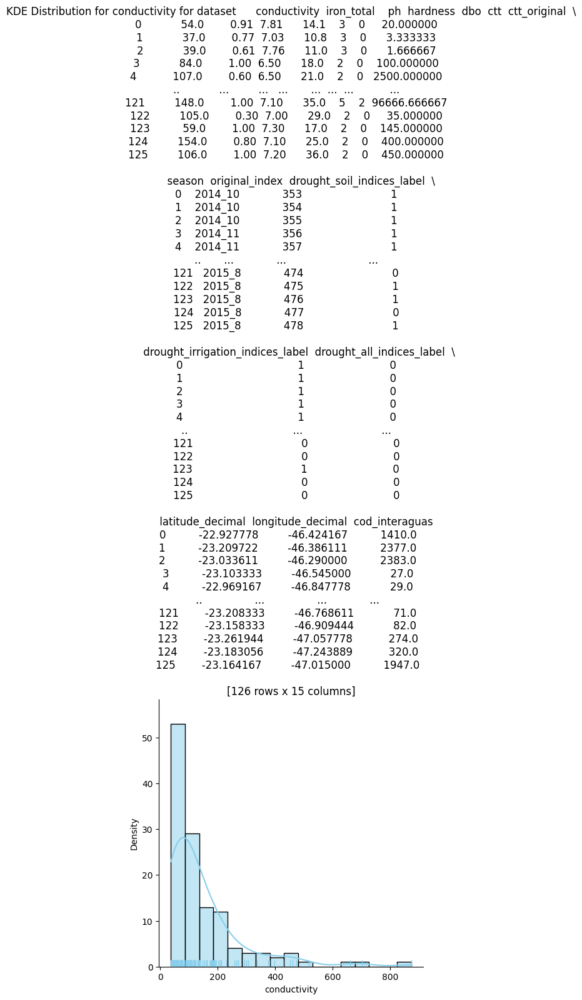

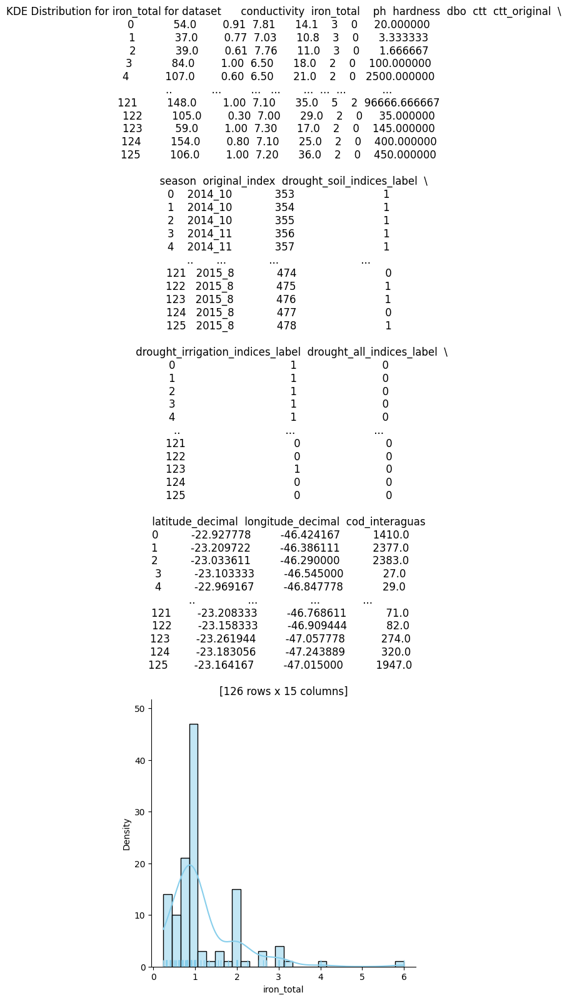

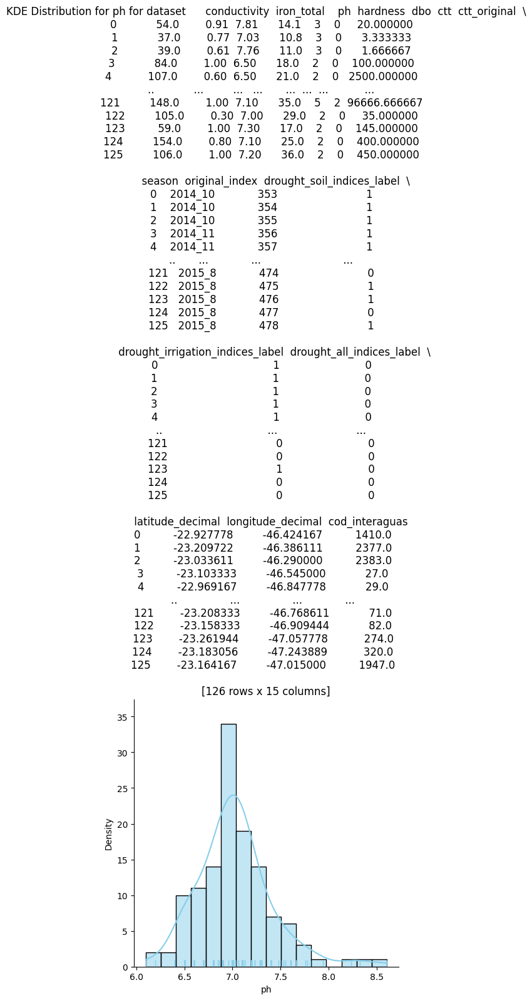

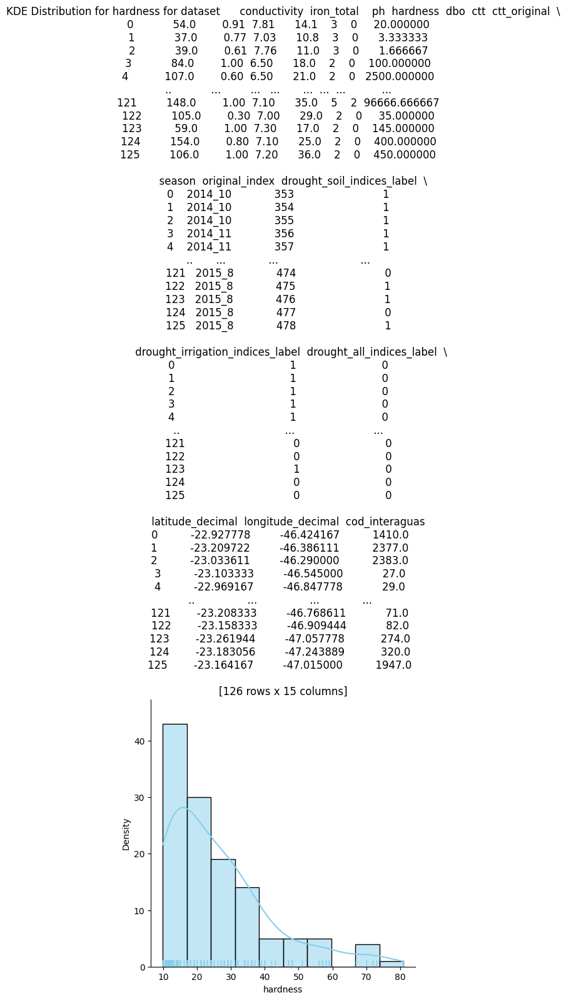

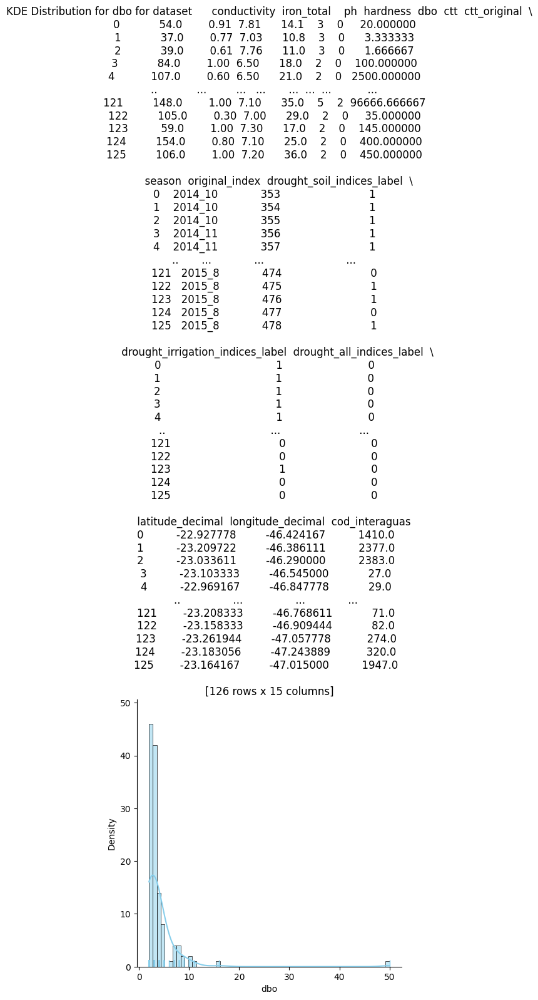

...

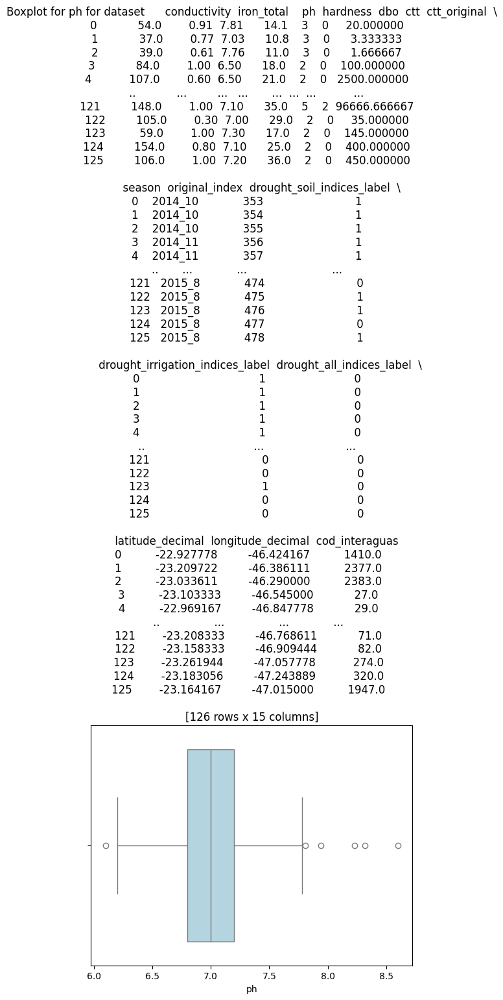

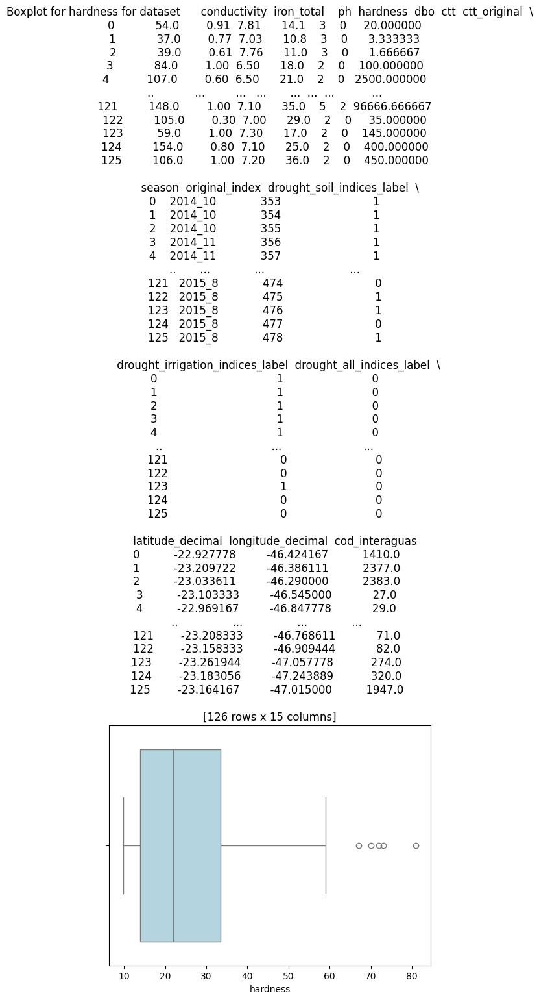

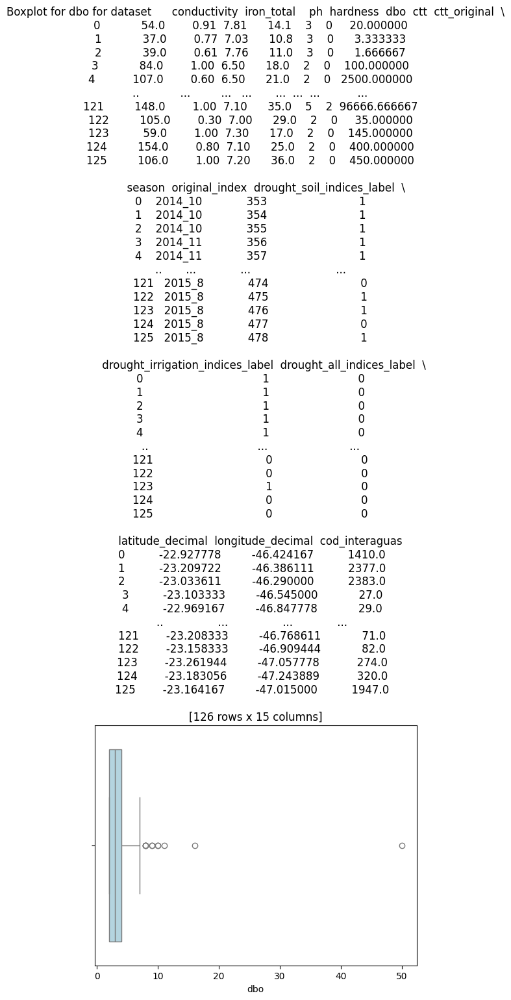

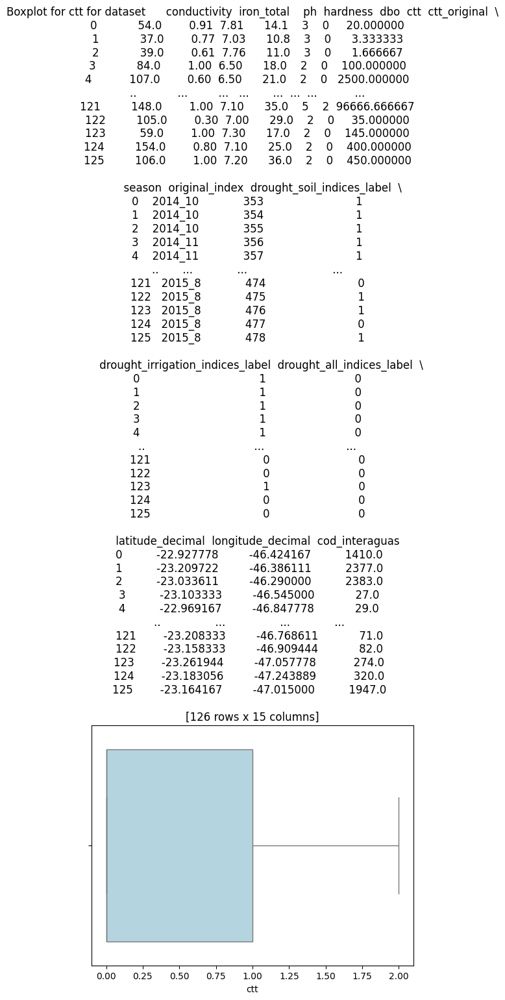

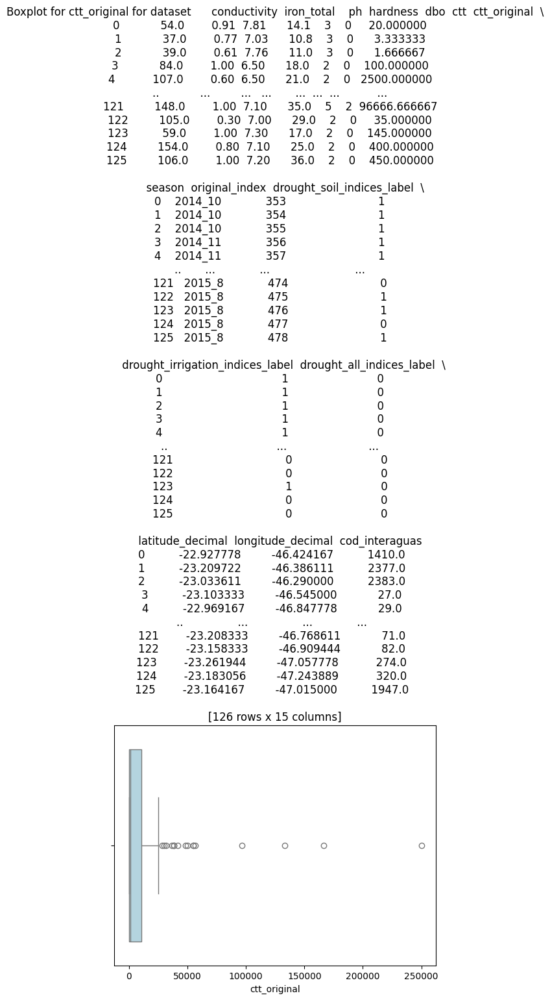

In [47]:
# Choose which variables or parameters will be analyzed for the drought dataset

variables_of_interest = ['conductivity', 'iron_total', 'ph', 'hardness', 'dbo', 'ctt', 'ctt_original']

# Calculate the basic statistics for each variable

basic_stats = drought_gdf[variables_of_interest].describe()
print(basic_stats)

# Draw KDE distributions for each column

for variable in variables_of_interest:
    sns.displot(drought_gdf[variable], kde=True, rug=True, color='skyblue', label='KDE')
    plt.title(f'KDE Distribution for {variable} for dataset {dataset}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

# Create boxplots for each column

for variable in variables_of_interest:
    sns.boxplot(x=drought_gdf[variable], color='lightblue')
    plt.title(f'Boxplot for {variable} for dataset {dataset}')
    plt.xlabel(variable)
    plt.show()


In [48]:
# Separate the data for the different seasons. S1 is the wet season, and S2 is the dry season

flood_gdf['season'].unique()

flood_gdf_s1 = flood_gdf[flood_gdf['season'].isin(['2011_11', '2011_12', '2012_1', '2012_2'])]
flood_gdf_s2 = flood_gdf[flood_gdf['season'].isin(['2012_5', '2012_6', '2012_7', '2012_8'])]

normal_gdf['season'].unique()

normal_gdf_s1 = normal_gdf[normal_gdf['season'].isin(['2012_11', '2012_12', '2013_1', '2013_2'])]
normal_gdf_s2 = normal_gdf[normal_gdf['season'].isin(['2013_5', '2013_6', '2013_7', '2013_8'])]

drought_gdf['season'].unique()

drought_gdf_s1 = drought_gdf[drought_gdf['season'].isin(['2014_10', '2014_11', '2014_12', '2015_1', '2015_2', '2015_3'])]
drought_gdf_s2 = drought_gdf[drought_gdf['season'].isin(['2015_4', '2015_5', '2015_6', '2015_7', '2015_8'])]

In [49]:
# Functions to aggregate data by station and then add the majority cluster labels
# for each station in each scenario (essential to develop maps of aggregated inputs and of cluster labels)

# Define custom aggregation functions
def majority_value(series):
    return series.mode().iloc[0]

def list_of_values(series):
    return series.tolist()

# Define the aggregation dictionary
agg_dict = {
    'latitude_decimal': 'mean',
    'longitude_decimal': 'mean',
    'geometry': majority_value,
    'conductivity': 'mean',
    'iron_total': 'mean',
    'ph': 'mean',
    'hardness': 'mean',
    'ctt': majority_value,
    'ctt_original': 'mean',
    'dbo': 'mean',
    'flood_soil_indices_label': majority_value,
    'flood_irrigation_indices_label': majority_value,
    'flood_all_indices_label': majority_value,
    'original_index': list_of_values
}

# Group the data by the unique ID of each station ('cod_interaguas')
# and aggregate them using the custom aggregation dictionary (essential for building better maps)

flood_gdf = flood_gdf.groupby('cod_interaguas').agg(agg_dict).reset_index()

agg_dict = {
    'latitude_decimal': 'mean',
    'longitude_decimal': 'mean',
    'geometry': majority_value,
    'conductivity': 'mean',
    'iron_total': 'mean',
    'ph': 'mean',
    'hardness': 'mean',
    'ctt': majority_value,
    'ctt_original': 'mean',
    'dbo': 'mean',
    'normal_soil_indices_label': majority_value,
    'normal_irrigation_indices_label': majority_value,
    'normal_all_indices_label': majority_value,
    'original_index': list_of_values
}


normal_gdf = normal_gdf.groupby('cod_interaguas').agg(agg_dict).reset_index()

agg_dict = {
    'latitude_decimal': 'mean',
    'longitude_decimal': 'mean',
    'geometry': majority_value,
    'conductivity': 'mean',
    'iron_total': 'mean',
    'ph': 'mean',
    'hardness': 'mean',
    'ctt': majority_value,
    'ctt_original': 'mean',
    'dbo': 'mean',
    'drought_soil_indices_label': majority_value,
    'drought_irrigation_indices_label': majority_value,
    'drought_all_indices_label': majority_value,
    'original_index': list_of_values
}


drought_gdf = drought_gdf.groupby('cod_interaguas').agg(agg_dict).reset_index()



In [50]:
# Check one specific line to see if the aggregation and the cluster labels adding worked

drought_gdf[drought_gdf['cod_interaguas'] == 2377]

,cod_interaguas,latitude_decimal,longitude_decimal,geometry,conductivity,iron_total,ph,hardness,ctt,ctt_original,dbo,drought_soil_indices_label,drought_irrigation_indices_label,drought_all_indices_label,original_index
25,2377.0,-23.209722,-46.386111,POINT (-46.38611 -23.20972),52.142857,1.181429,7.095714,10.897143,0,144.047619,3.0,1,1,0,"[354, 375, 385, 407, 417, 422, 426]"


In [51]:
# Check one dataset to see if the aggregation and the cluster labels adding worked

flood_gdf

,cod_interaguas,latitude_decimal,longitude_decimal,geometry,conductivity,iron_total,ph,hardness,ctt,ctt_original,dbo,flood_soil_indices_label,flood_irrigation_indices_label,flood_all_indices_label,original_index
0,27.0,-23.103333,-46.545000,POINT (-46.54500 -23.10333),57.750000,1.750000,6.800,14.750000,0,1418.250000,2.000000,0,0,0,"[46, 69, 93, 117]"
1,29.0,-22.969167,-46.847778,POINT (-46.84778 -22.96917),66.500000,2.000000,6.800,16.500000,0,7000.000000,2.000000,0,0,0,"[47, 70, 94, 118]"
2,30.0,-22.937778,-46.933611,POINT (-46.93361 -22.93778),82.250000,3.250000,6.850,16.500000,0,6575.000000,2.000000,0,0,0,"[48, 71, 95, 119]"
3,32.0,-22.908333,-46.543611,POINT (-46.54361 -22.90833),53.500000,1.450000,6.900,12.000000,0,3688.333333,2.250000,0,0,0,"[49, 72, 96, 120]"
4,34.0,-22.746667,-46.897778,POINT (-46.89778 -22.74667),65.000000,1.750000,7.025,16.500000,0,6300.000000,2.250000,0,0,0,"[50, 73, 97, 121]"
5,35.0,-22.712222,-46.971389,POINT (-46.97139 -22.71222),75.750000,1.500000,6.950,17.750000,1,18083.333333,2.250000,0,0,0,"[51, 74, 98, 122]"
6,37.0,-22.698889,-47.151944,POINT (-47.15194 -22.69889),93.500000,2.000000,6.925,28.750000,0,3291.666667,3.500000,0,0,0,"[52, 75, 99, 123]"
7,38.0,-22.662222,-47.277778,POINT (-47.27778 -22.66222),74.675000,2.500000,7.025,19.000000,0,4050.000000,2.500000,0,0,0,"[53, 76, 100, 124]"
8,40.0,-22.702500,-46.749444,POINT (-46.74944 -22.70250),56.666667,9.333333,7.000,33.666667,1,11166.666667,4.666667,0,1,0,"[77, 101, 125]"
9,43.0,-22.710833,-47.322778,POINT (-47.32278 -22.71083),150.000000,1.750000,6.925,31.500000,0,3841.666667,3.500000,0,0,1,"[54, 78, 102, 126]"


In [52]:
# Extract the x and y of all points in each dataset

geometry = [Point(xy) for xy in zip(flood_gdf['longitude_decimal'], flood_gdf['latitude_decimal'])]
flood_gdf = gpd.GeoDataFrame(flood_gdf, geometry=geometry, crs=shapefile.crs)

geometry = [Point(xy) for xy in zip(normal_gdf['longitude_decimal'], normal_gdf['latitude_decimal'])]
normal_gdf = gpd.GeoDataFrame(normal_gdf, geometry=geometry, crs=shapefile.crs)

geometry = [Point(xy) for xy in zip(drought_gdf['longitude_decimal'], drought_gdf['latitude_decimal'])]
drought_gdf = gpd.GeoDataFrame(drought_gdf, geometry=geometry, crs=shapefile.crs)


#11. Build maps to improve the spatial analyses of inputs and clusters:

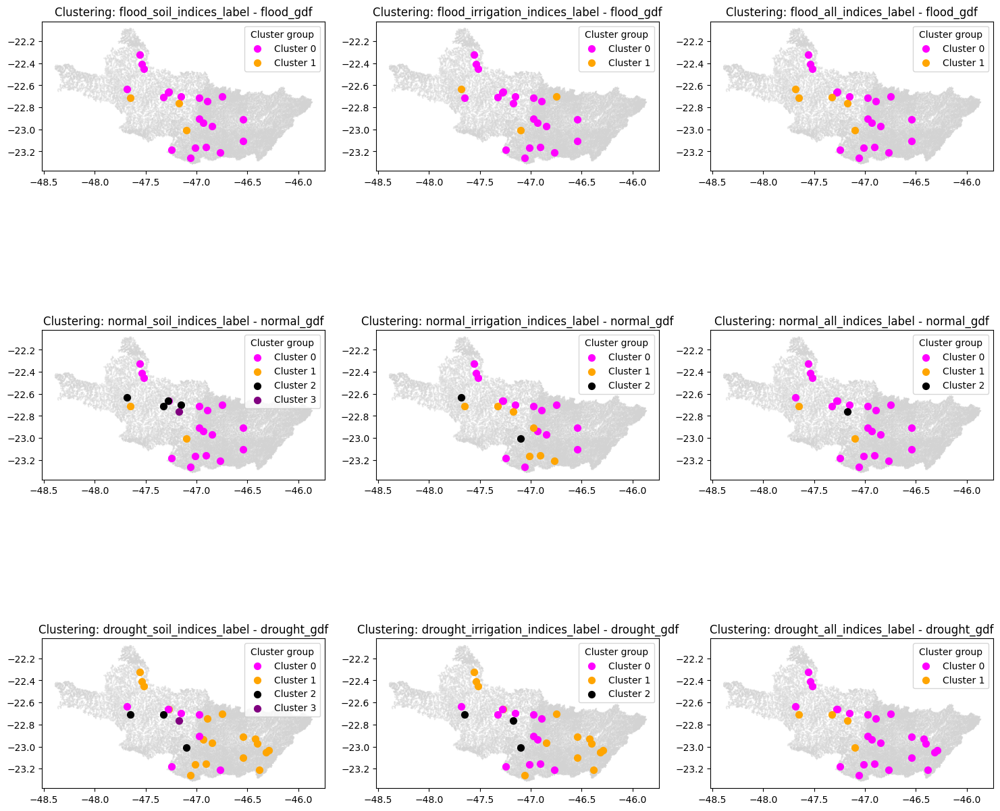

In [62]:
# Code for building all maps for the aggregated cluster labels results
# The subsequent code blocks are the almost the same, but for the individual variables, and considering
# the quantile of values (because the intervals for the different variables are distinct)

# Define colors for specific cluster values
value_colors = {
    0: 'fuchsia',
    1: 'orange',
    2: 'black',
    3: 'purple',
    4: 'orange'
}

# Define the datasets and their corresponding variables
datasets = {
    'flood_gdf': ['flood_soil_indices_label', 'flood_irrigation_indices_label', 'flood_all_indices_label'],
    'normal_gdf': ['normal_soil_indices_label', 'normal_irrigation_indices_label', 'normal_all_indices_label'],
    'drought_gdf': ['drought_soil_indices_label', 'drought_irrigation_indices_label', 'drought_all_indices_label']
}

# Create the subplots (the first is the full dataset for the hydrological year, the other two are the individual seasons)
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_name, variables) in enumerate(datasets.items()):
    for j, variable in enumerate(variables):
        ax = axs[i, j]

        # Plot the shapefile as background with reduced transparency
        shapefile.plot(ax=ax, color='lightgrey', alpha=0.5, zorder=1)

        # Define the circle size (defined empirically)
        circle_size = 50

        # Filter out existing values
        existing_values = globals()[dataset_name][variable].unique()

        # Plot the circles for the chosen variable
        for value in existing_values:
            color = value_colors.get(value)
            if color:
                filter_values = globals()[dataset_name][globals()[dataset_name][variable] == value]
                ax.scatter(filter_values.geometry.x, filter_values.geometry.y, color=color, label=f'Cluster {value}', s=circle_size, zorder=2)

        # Create the title
        ax.set_title(f'Clustering: {variable} - {dataset_name}')

        # Add legend and sort labels
        handles, labels = ax.get_legend_handles_labels()
        labels, handles = zip(*sorted(zip(labels, handles), key=lambda x: int(x[0].split()[1])))
        ax.legend(handles, labels, title='Cluster group', loc='upper right')

# Adjust the layoutlayout
plt.tight_layout()

# Show the final plot
plt.show()


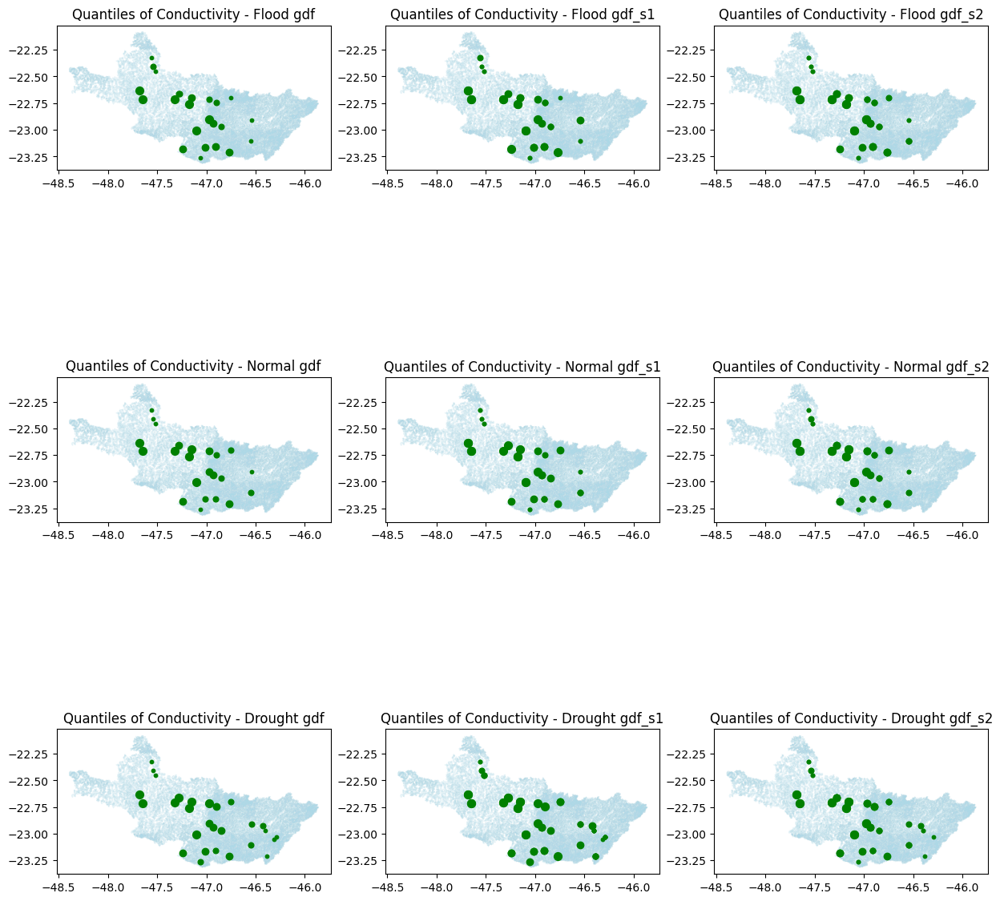

In [63]:
# Maps for conductivity

variable_colors = {
    'conductivity': 'green',
}

quantiles = [0, 25, 50, 75, 100]

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_suffix, suffix_df) in enumerate([('gdf', 'flood'), ('gdf_s1', 'flood'), ('gdf_s2', 'flood'),
                                                 ('gdf', 'normal'), ('gdf_s1', 'normal'), ('gdf_s2', 'normal'),
                                                 ('gdf', 'drought'), ('gdf_s1', 'drought'), ('gdf_s2', 'drought')]):

    ax = axs[i // 3, i % 3]
    shapefile.plot(ax=ax, color='lightblue', alpha=0.3, zorder=1)

    circle_sizes = np.linspace(10, 50, len(quantiles) - 1)

    if len(quantiles) >= 2:
        for k in range(len(quantiles) - 1):
            lower_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['conductivity'], quantiles[k])
            upper_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['conductivity'], quantiles[k + 1])
            subset = globals()[f'{suffix_df}_{dataset_suffix}'][
                (globals()[f'{suffix_df}_{dataset_suffix}']['conductivity'] >= lower_bound) &
                (globals()[f'{suffix_df}_{dataset_suffix}']['conductivity'] <= upper_bound)]
            circle_size = circle_sizes[k]
            ax.scatter(subset.geometry.x, subset.geometry.y, color='green',
                       label=f'conductivity - {quantiles[k]}-{quantiles[k + 1]}%', s=circle_size, zorder=2)

    ax.set_title(f'Quantiles of Conductivity - {suffix_df.capitalize()} {dataset_suffix}')

plt.subplots_adjust(bottom=0.05)
plt.show()

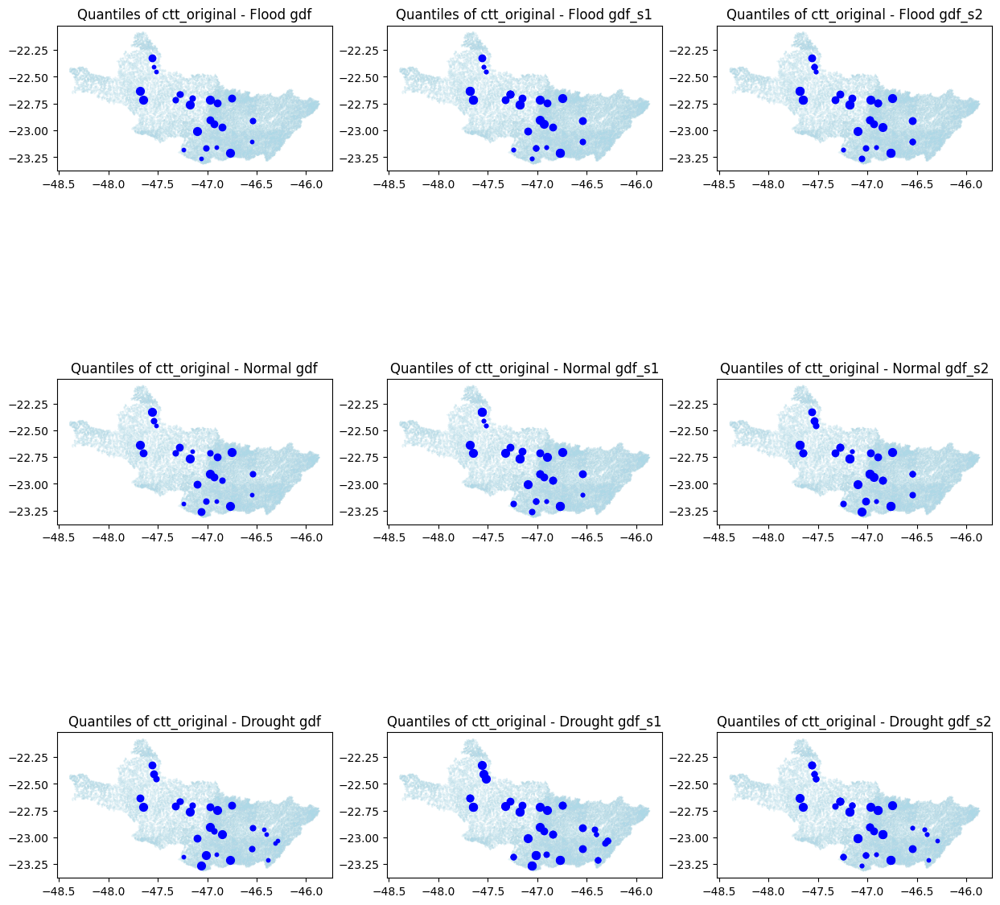

In [64]:
# Maps for the original TtC values

variable_colors = {
    'ctt_original': 'blue'
}

quantiles = [0, 25, 50, 75, 100]

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_suffix, suffix_df) in enumerate([('gdf', 'flood'), ('gdf_s1', 'flood'), ('gdf_s2', 'flood'),
                                                 ('gdf', 'normal'), ('gdf_s1', 'normal'), ('gdf_s2', 'normal'),
                                                 ('gdf', 'drought'), ('gdf_s1', 'drought'), ('gdf_s2', 'drought')]):

    ax = axs[i // 3, i % 3]
    shapefile.plot(ax=ax, color='lightblue', alpha=0.3, zorder=1)

    circle_sizes = np.linspace(10, 50, len(quantiles) - 1)

    if len(quantiles) >= 2:
        for k in range(len(quantiles) - 1):
            lower_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['ctt_original'], quantiles[k])
            upper_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['ctt_original'], quantiles[k + 1])
            subset = globals()[f'{suffix_df}_{dataset_suffix}'][
                (globals()[f'{suffix_df}_{dataset_suffix}']['ctt_original'] >= lower_bound) &
                (globals()[f'{suffix_df}_{dataset_suffix}']['ctt_original'] <= upper_bound)]
            circle_size = circle_sizes[k]
            ax.scatter(subset.geometry.x, subset.geometry.y, color='blue',
                       label=f'ctt_original - {quantiles[k]}-{quantiles[k + 1]}%', s=circle_size, zorder=2)

    ax.set_title(f'Quantiles of ctt_original - {suffix_df.capitalize()} {dataset_suffix}')

plt.subplots_adjust(bottom=0.05)
plt.show()


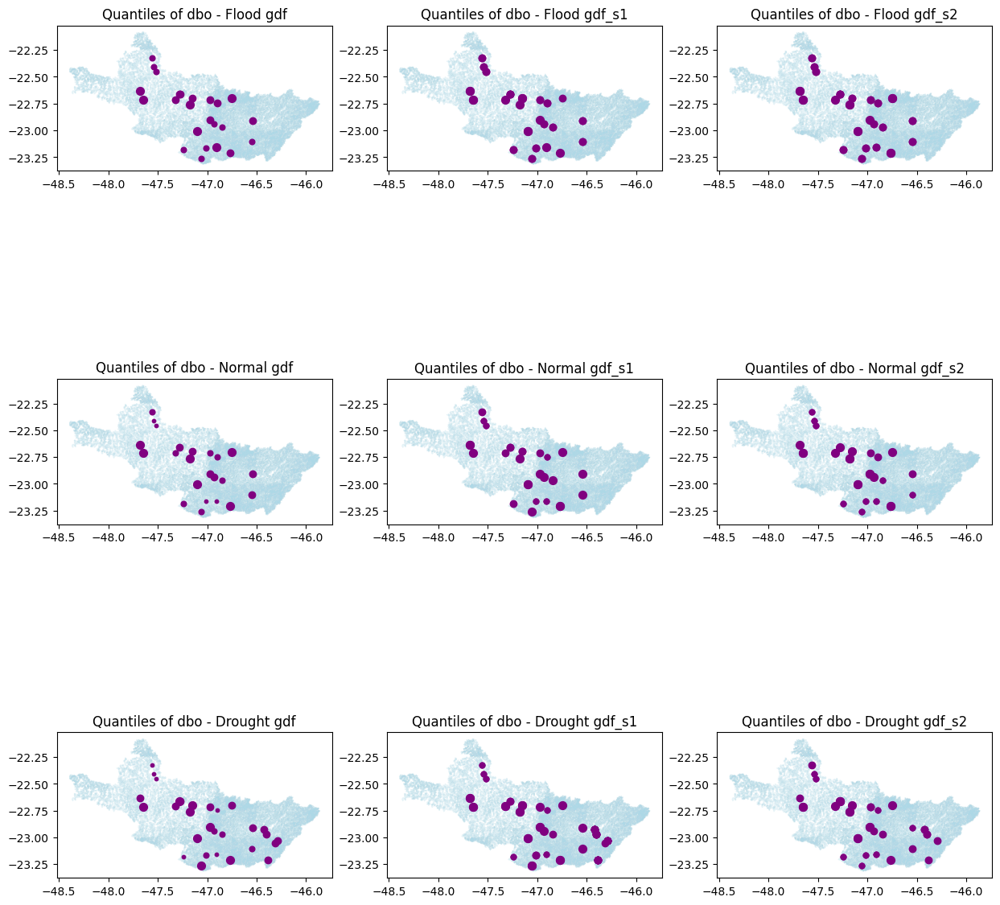

In [65]:
# Maps for BOD

variable_colors = {
    'dbo': 'purple',
}

quantiles = [0, 25, 50, 75, 100]

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_suffix, suffix_df) in enumerate([('gdf', 'flood'), ('gdf_s1', 'flood'), ('gdf_s2', 'flood'),
                                                 ('gdf', 'normal'), ('gdf_s1', 'normal'), ('gdf_s2', 'normal'),
                                                 ('gdf', 'drought'), ('gdf_s1', 'drought'), ('gdf_s2', 'drought')]):

    ax = axs[i // 3, i % 3]
    shapefile.plot(ax=ax, color='lightblue', alpha=0.3, zorder=1)

    circle_sizes = np.linspace(10, 50, len(quantiles) - 1)

    if len(quantiles) >= 2:
        for k in range(len(quantiles) - 1):
            lower_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['dbo'], quantiles[k])
            upper_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['dbo'], quantiles[k + 1])
            subset = globals()[f'{suffix_df}_{dataset_suffix}'][
                (globals()[f'{suffix_df}_{dataset_suffix}']['dbo'] >= lower_bound) &
                (globals()[f'{suffix_df}_{dataset_suffix}']['dbo'] <= upper_bound)]
            circle_size = circle_sizes[k]
            ax.scatter(subset.geometry.x, subset.geometry.y, color='purple',
                       label=f'dbo - {quantiles[k]}-{quantiles[k + 1]}%', s=circle_size, zorder=2)

    ax.set_title(f'Quantiles of dbo - {suffix_df.capitalize()} {dataset_suffix}')

plt.subplots_adjust(bottom=0.05)
plt.show()


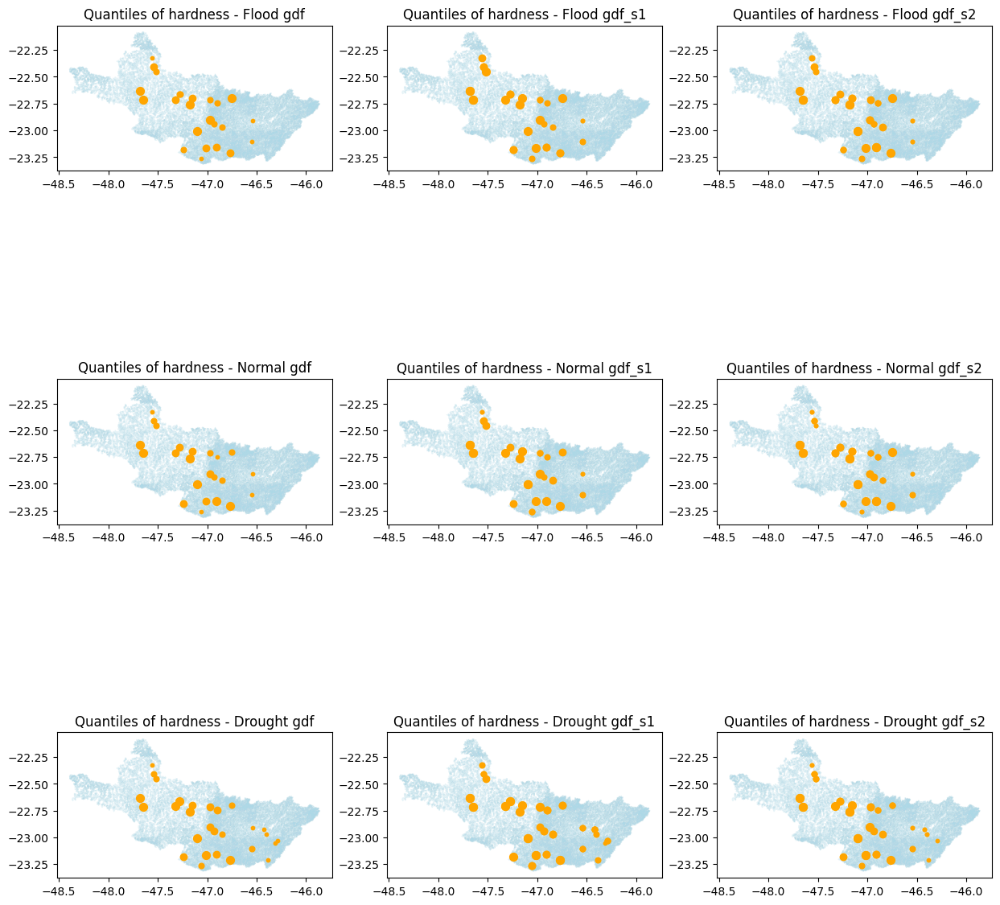

In [66]:
# Maps for hardness

variable_colors = {
    'hardness': 'orange',
}

quantiles = [0, 25, 50, 75, 100]

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_suffix, suffix_df) in enumerate([('gdf', 'flood'), ('gdf_s1', 'flood'), ('gdf_s2', 'flood'),
                                                 ('gdf', 'normal'), ('gdf_s1', 'normal'), ('gdf_s2', 'normal'),
                                                 ('gdf', 'drought'), ('gdf_s1', 'drought'), ('gdf_s2', 'drought')]):

    ax = axs[i // 3, i % 3]
    shapefile.plot(ax=ax, color='lightblue', alpha=0.3, zorder=1)

    circle_sizes = np.linspace(10, 50, len(quantiles) - 1)

    if len(quantiles) >= 2:
        for k in range(len(quantiles) - 1):
            lower_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['hardness'], quantiles[k])
            upper_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['hardness'], quantiles[k + 1])
            subset = globals()[f'{suffix_df}_{dataset_suffix}'][
                (globals()[f'{suffix_df}_{dataset_suffix}']['hardness'] >= lower_bound) &
                (globals()[f'{suffix_df}_{dataset_suffix}']['hardness'] <= upper_bound)]
            circle_size = circle_sizes[k]
            ax.scatter(subset.geometry.x, subset.geometry.y, color='orange',
                       label=f'hardness - {quantiles[k]}-{quantiles[k + 1]}%', s=circle_size, zorder=2)

    ax.set_title(f'Quantiles of hardness - {suffix_df.capitalize()} {dataset_suffix}')

plt.subplots_adjust(bottom=0.05)
plt.show()


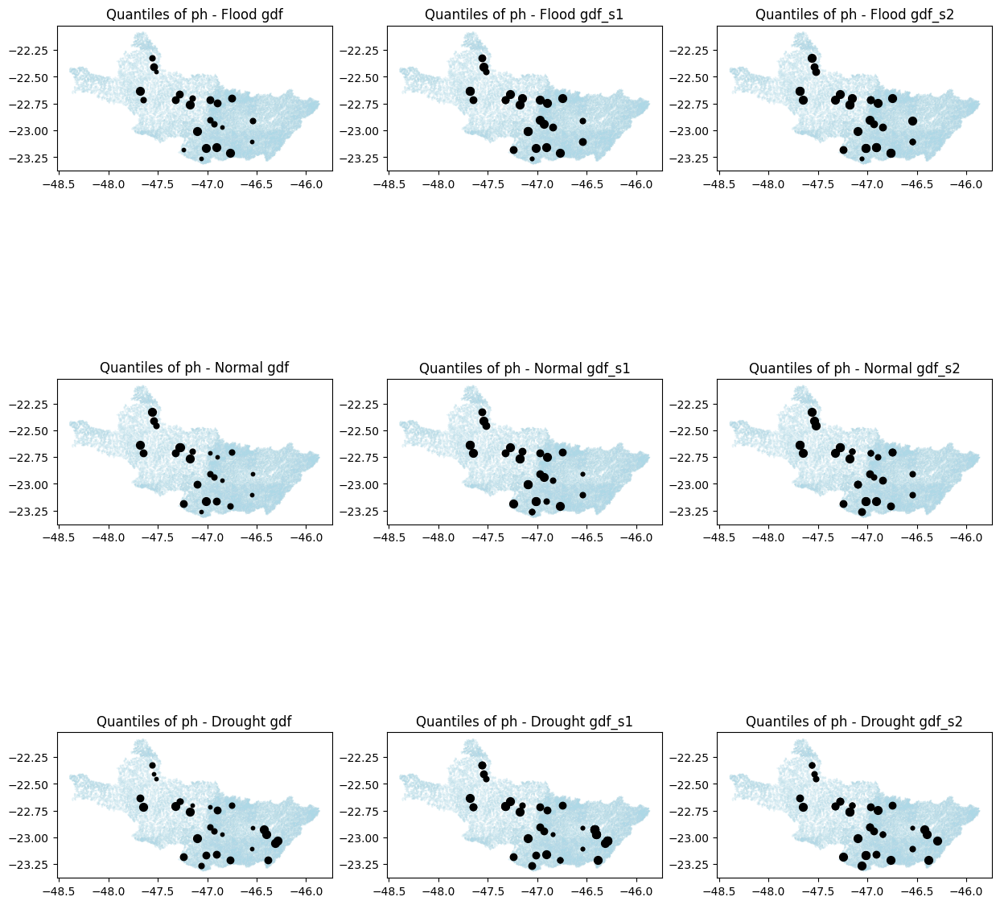

In [67]:
# Maps for pH

variable_colors = {
    'ph': 'black',
}

quantiles = [0, 25, 50, 75, 100]

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_suffix, suffix_df) in enumerate([('gdf', 'flood'), ('gdf_s1', 'flood'), ('gdf_s2', 'flood'),
                                                 ('gdf', 'normal'), ('gdf_s1', 'normal'), ('gdf_s2', 'normal'),
                                                 ('gdf', 'drought'), ('gdf_s1', 'drought'), ('gdf_s2', 'drought')]):

    ax = axs[i // 3, i % 3]
    shapefile.plot(ax=ax, color='lightblue', alpha=0.3, zorder=1)

    circle_sizes = np.linspace(10, 50, len(quantiles) - 1)

    if len(quantiles) >= 2:
        for k in range(len(quantiles) - 1):
            lower_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['ph'], quantiles[k])
            upper_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['ph'], quantiles[k + 1])
            subset = globals()[f'{suffix_df}_{dataset_suffix}'][
                (globals()[f'{suffix_df}_{dataset_suffix}']['ph'] >= lower_bound) &
                (globals()[f'{suffix_df}_{dataset_suffix}']['ph'] <= upper_bound)]
            circle_size = circle_sizes[k]
            ax.scatter(subset.geometry.x, subset.geometry.y, color='black',
                       label=f'ph - {quantiles[k]}-{quantiles[k + 1]}%', s=circle_size, zorder=2)

    ax.set_title(f'Quantiles of ph - {suffix_df.capitalize()} {dataset_suffix}')

plt.subplots_adjust(bottom=0.05)
plt.show()


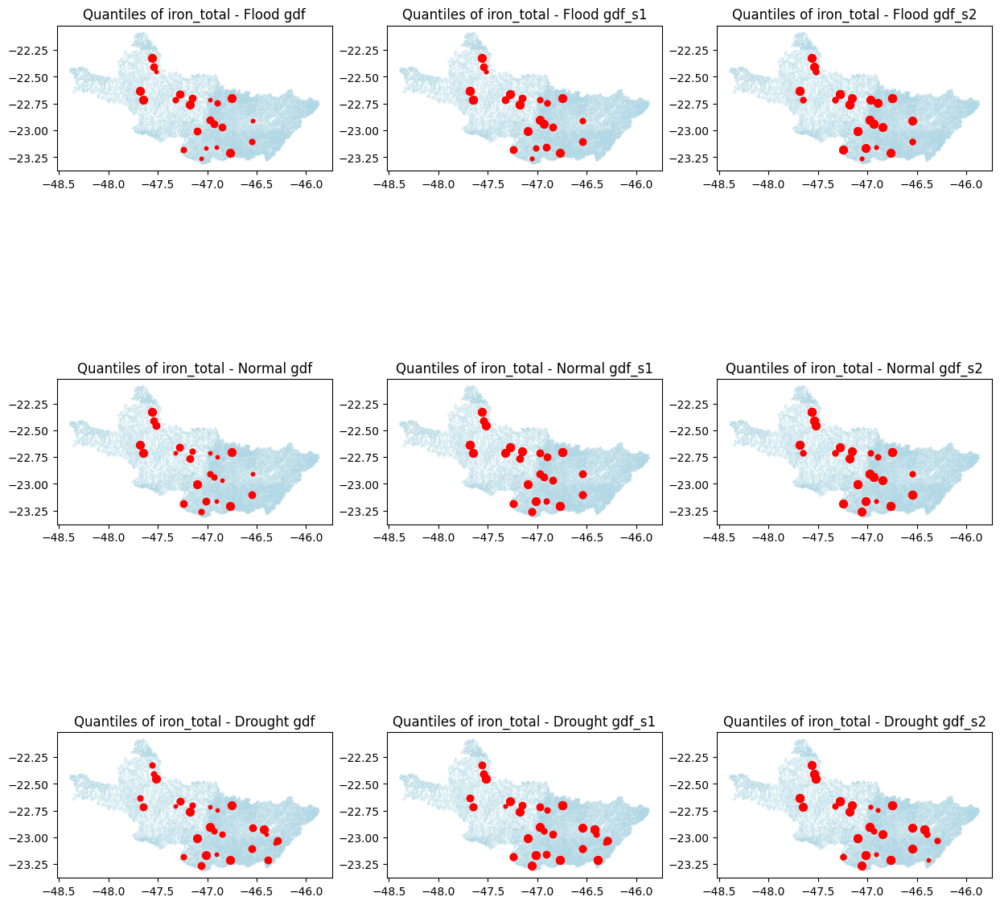

In [68]:
# Maps for total iron

variable_colors = {
    'iron_total': 'red',
}

quantiles = [0, 25, 50, 75, 100]

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, (dataset_suffix, suffix_df) in enumerate([('gdf', 'flood'), ('gdf_s1', 'flood'), ('gdf_s2', 'flood'),
                                                 ('gdf', 'normal'), ('gdf_s1', 'normal'), ('gdf_s2', 'normal'),
                                                 ('gdf', 'drought'), ('gdf_s1', 'drought'), ('gdf_s2', 'drought')]):

    ax = axs[i // 3, i % 3]
    shapefile.plot(ax=ax, color='lightblue', alpha=0.3, zorder=1)

    circle_sizes = np.linspace(10, 50, len(quantiles) - 1)

    if len(quantiles) >= 2:
        for k in range(len(quantiles) - 1):
            lower_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['iron_total'], quantiles[k])
            upper_bound = np.percentile(globals()[f'{suffix_df}_{dataset_suffix}']['iron_total'], quantiles[k + 1])
            subset = globals()[f'{suffix_df}_{dataset_suffix}'][
                (globals()[f'{suffix_df}_{dataset_suffix}']['iron_total'] >= lower_bound) &
                (globals()[f'{suffix_df}_{dataset_suffix}']['iron_total'] <= upper_bound)]
            circle_size = circle_sizes[k]
            ax.scatter(subset.geometry.x, subset.geometry.y, color='red',
                       label=f'iron_total - {quantiles[k]}-{quantiles[k + 1]}%', s=circle_size, zorder=2)

    ax.set_title(f'Quantiles of iron_total - {suffix_df.capitalize()} {dataset_suffix}')

plt.subplots_adjust(bottom=0.05)
plt.show()


#12. Create a dataset with the main statistical metrics for each variable or parameter

In [69]:
# Create a dataset with the main statistical metrics (mean, std, coefficient of variation,
# minimum, and maximum values) for each variable and dataset

# Define the datasets
datasets = {
    'flood_gdf': flood_gdf,
    'normal_gdf': normal_gdf,
    'drought_gdf': drought_gdf
}

# Define the variables to be summarized
variables = ['conductivity', 'iron_total', 'ph', 'hardness','dbo', 'ctt', 'ctt_original']

# Create an empty list to store the results
results = []

# Loop for iterating over each dataset
for dataset_name, dataset in datasets.items():

    # Loop for iterating over each variable
    for variable in variables:

        # Calculate the statistical metrics (it is possible to add more metrics)
        mean_val = dataset[variable].mean()
        std_val = dataset[variable].std()
        coef_var = (std_val / mean_val) * 100
        min_val = dataset[variable].min()
        max_val = dataset[variable].max()

        # Append the statistics to the results list
        results.append({'Dataset': dataset_name, 'Variable': variable, 'Statistic': 'mean', 'Value': mean_val})
        results.append({'Dataset': dataset_name, 'Variable': variable, 'Statistic': 'std', 'Value': std_val})
        results.append({'Dataset': dataset_name, 'Variable': variable, 'Statistic': 'coef_var', 'Value': coef_var})
        results.append({'Dataset': dataset_name, 'Variable': variable, 'Statistic': 'min', 'Value': min_val})
        results.append({'Dataset': dataset_name, 'Variable': variable, 'Statistic': 'max', 'Value': max_val})

# Create a DataFrame from the results list
stats_df = pd.DataFrame(results)

# Print the DataFrame
stats_df

,Dataset,Variable,Statistic,Value
0,flood_gdf,conductivity,mean,92.523611
1,flood_gdf,conductivity,std,47.871549
2,flood_gdf,conductivity,coef_var,51.739820
3,flood_gdf,conductivity,min,45.250000
4,flood_gdf,conductivity,max,221.000000
...,...,...,...,...
100,drought_gdf,ctt_original,mean,13625.235016
101,drought_gdf,ctt_original,std,22488.996880
102,drought_gdf,ctt_original,coef_var,165.054011
103,drought_gdf,ctt_original,min,2.619048
